In [1]:
# Import all necessary libraries 

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import json
import csv
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
sns.set()

# allowing all the columns to be visualized
pd.options.display.max_columns = None

# rendering all graphics straight out of the notebook
%matplotlib inline

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
pd.set_option('display.max_rows', None)


In [3]:
fd= pd.read_csv("C:/Users/Dimitris/Desktop/project spotify/testlargefiles/data/adulthood/adulthood_dataframe.csv")

## EXPLORING DATA

## Inspecting DataFrame

In [4]:
full=fd

In [5]:
full.shape

(2897, 72)

In [6]:
full.head(1)

,tr_available_markets,tr_disc_number,tr_duration_ms,tr_explicit,tr_href,tr_id,tr_is_local,tr_name,tr_popularity,tr_preview_url,tr_track_number,tr_type,tr_uri,tr_track_artist_id,tr_album_album_type,tr_album_artists,tr_album_available_markets,tr_album_external_urls_spotify,tr_album_href,tr_album_id,tr_album_images,tr_album_name,tr_album_release_date,tr_album_release_date_precision,tr_album_total_tracks,tr_album_type,tr_album_uri,tr_external_ids_isrc,tr_external_urls_spotify,al_album_group,al_album_type,al_artists,al_available_markets,al_href,al_id,al_images,al_name,al_release_date,al_release_date_precision,al_total_tracks,al_type,al_uri,al_artist_id,al_external_urls_spotify,ar_href,ar_id,ar_images,ar_name,ar_popularity,ar_type,ar_uri,ar_external_urls_spotify,ar_followers_href,ar_followers_total,tf_danceability,tf_energy,tf_key,tf_loudness,tf_mode,tf_speechiness,tf_acousticness,tf_instrumentalness,tf_liveness,tf_valence,tf_tempo,tf_type,tf_id,tf_uri,tf_track_href,tf_analysis_url,tf_duration_ms,tf_time_signature
0,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",1,38826,False,https://api.spotify.com/v1/tracks/6gUejkYukr6D...,6gUejkYukr6D9MfZaJawPS,False,"Churchill’s Speech - Live in Mexico City, Pala...",41,https://p.scdn.co/mp3-preview/501552516390e845...,1,track,spotify:track:6gUejkYukr6D9MfZaJawPS,6mdiAmATAx73kdxrNrnlao,album,[{'external_urls': {'spotify': 'https://open.s...,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://open.spotify.com/album/6IVkf5av5jnraZp...,https://api.spotify.com/v1/albums/6IVkf5av5jnr...,6IVkf5av5jnraZpLPszoZR,"[{'height': 640, 'url': 'https://i.scdn.co/ima...","Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,day,17,album,spotify:album:6IVkf5av5jnraZpLPszoZR,GBCHB2000001,https://open.spotify.com/track/6gUejkYukr6D9Mf...,album,album,[{'external_urls': {'spotify': 'https://open.s...,"['AD', 'AE', 'AG', 'AL', 'AM', 'AO', 'AR', 'AT...",https://api.spotify.com/v1/albums/6IVkf5av5jnr...,6IVkf5av5jnraZpLPszoZR,"[{'height': 640, 'url': 'https://i.scdn.co/ima...","Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,day,17.0,album,spotify:album:6IVkf5av5jnraZpLPszoZR,6mdiAmATAx73kdxrNrnlao,https://open.spotify.com/album/6IVkf5av5jnraZp...,https://api.spotify.com/v1/artists/6mdiAmATAx7...,6mdiAmATAx73kdxrNrnlao,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Iron Maiden,77.0,artist,spotify:artist:6mdiAmATAx73kdxrNrnlao,https://open.spotify.com/artist/6mdiAmATAx73kd...,NaN,6201079.0,0.338,0.904,5,-12.851,0,0.161,0.433,0.134,0.91,0.0394,85.128,audio_features,6gUejkYukr6D9MfZaJawPS,spotify:track:6gUejkYukr6D9MfZaJawPS,https://api.spotify.com/v1/tracks/6gUejkYukr6D...,https://api.spotify.com/v1/audio-analysis/6gUe...,38827,3


In [7]:
full.tail(1)

,tr_available_markets,tr_disc_number,tr_duration_ms,tr_explicit,tr_href,tr_id,tr_is_local,tr_name,tr_popularity,tr_preview_url,tr_track_number,tr_type,tr_uri,tr_track_artist_id,tr_album_album_type,tr_album_artists,tr_album_available_markets,tr_album_external_urls_spotify,tr_album_href,tr_album_id,tr_album_images,tr_album_name,tr_album_release_date,tr_album_release_date_precision,tr_album_total_tracks,tr_album_type,tr_album_uri,tr_external_ids_isrc,tr_external_urls_spotify,al_album_group,al_album_type,al_artists,al_available_markets,al_href,al_id,al_images,al_name,al_release_date,al_release_date_precision,al_total_tracks,al_type,al_uri,al_artist_id,al_external_urls_spotify,ar_href,ar_id,ar_images,ar_name,ar_popularity,ar_type,ar_uri,ar_external_urls_spotify,ar_followers_href,ar_followers_total,tf_danceability,tf_energy,tf_key,tf_loudness,tf_mode,tf_speechiness,tf_acousticness,tf_instrumentalness,tf_liveness,tf_valence,tf_tempo,tf_type,tf_id,tf_uri,tf_track_href,tf_analysis_url,tf_duration_ms,tf_time_signature
2896,"['CA', 'US']",5,154795,False,https://api.spotify.com/v1/tracks/31ff2s4BUKVx...,31ff2s4BUKVx0i0EKHM2Gc,False,(Anesthesia) – Pulling Teeth (Live at The Keys...,14,https://p.scdn.co/mp3-preview/d7041eea208c0bf5...,9,track,spotify:track:31ff2s4BUKVx0i0EKHM2Gc,2ye2Wgw4gimLv2eAKyk1NB,album,[{'external_urls': {'spotify': 'https://open.s...,"['CA', 'US']",https://open.spotify.com/album/7GttoSWxEi5lZvI...,https://api.spotify.com/v1/albums/7GttoSWxEi5l...,7GttoSWxEi5lZvIWeSrh6n,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Kill 'Em All (Deluxe Remaster),1983-07-25,day,54,album,spotify:album:7GttoSWxEi5lZvIWeSrh6n,QMKHM1600066,https://open.spotify.com/track/31ff2s4BUKVx0i0...,album,album,[{'external_urls': {'spotify': 'https://open.s...,"['CA', 'US']",https://api.spotify.com/v1/albums/7GttoSWxEi5l...,7GttoSWxEi5lZvIWeSrh6n,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Kill 'Em All (Deluxe Remaster),1983-07-25,day,54.0,album,spotify:album:7GttoSWxEi5lZvIWeSrh6n,2ye2Wgw4gimLv2eAKyk1NB,https://open.spotify.com/album/7GttoSWxEi5lZvI...,https://api.spotify.com/v1/artists/2ye2Wgw4gim...,2ye2Wgw4gimLv2eAKyk1NB,"[{'height': 640, 'url': 'https://i.scdn.co/ima...",Metallica,85.0,artist,spotify:artist:2ye2Wgw4gimLv2eAKyk1NB,https://open.spotify.com/artist/2ye2Wgw4gimLv2...,NaN,17257877.0,0.22,0.877,2,-7.49,1,0.06,0.689,0.84,0.868,0.55,101.343,audio_features,31ff2s4BUKVx0i0EKHM2Gc,spotify:track:31ff2s4BUKVx0i0EKHM2Gc,https://api.spotify.com/v1/tracks/31ff2s4BUKVx...,https://api.spotify.com/v1/audio-analysis/31ff...,154796,4


In [8]:
#full.info()

In [9]:
#full.dtypes

### Trimming redundant columns

In [10]:
full['ar_name'].unique()

array(['Iron Maiden', nan, 'Bruce Dickinson', 'Blind Guardian',
       'Iced Earth', 'Demons & Wizards', 'Theatre Of Tragedy',
       'Metallica'], dtype=object)

In [11]:
#Using the columns attribute to check DataFrame's columns

full.columns

Index(['tr_available_markets', 'tr_disc_number', 'tr_duration_ms',
       'tr_explicit', 'tr_href', 'tr_id', 'tr_is_local', 'tr_name',
       'tr_popularity', 'tr_preview_url', 'tr_track_number', 'tr_type',
       'tr_uri', 'tr_track_artist_id', 'tr_album_album_type',
       'tr_album_artists', 'tr_album_available_markets',
       'tr_album_external_urls_spotify', 'tr_album_href', 'tr_album_id',
       'tr_album_images', 'tr_album_name', 'tr_album_release_date',
       'tr_album_release_date_precision', 'tr_album_total_tracks',
       'tr_album_type', 'tr_album_uri', 'tr_external_ids_isrc',
       'tr_external_urls_spotify', 'al_album_group', 'al_album_type',
       'al_artists', 'al_available_markets', 'al_href', 'al_id', 'al_images',
       'al_name', 'al_release_date', 'al_release_date_precision',
       'al_total_tracks', 'al_type', 'al_uri', 'al_artist_id',
       'al_external_urls_spotify', 'ar_href', 'ar_id', 'ar_images', 'ar_name',
       'ar_popularity', 'ar_type', 'ar_uri', '

In [12]:
# dropping columns that won't be used for analysis

full=full.drop(columns=['tr_available_markets', 'tr_disc_number',
       'tr_href', 'tr_id', 'tr_is_local', 'tr_preview_url', 'tr_type',
       'tr_uri', 'tr_track_artist_id', 'tr_album_album_type',
       'tr_album_artists', 'tr_album_available_markets',
       'tr_album_external_urls_spotify', 'tr_album_href', 'tr_album_id',
       'tr_album_images', 'tr_album_name', 'tr_album_release_date',
       'tr_album_release_date_precision', 'tr_album_total_tracks',
       'tr_album_type', 'tr_album_uri', 'tr_external_ids_isrc',
       'tr_external_urls_spotify', 'al_album_group',
       'al_artists', 'al_available_markets', 'al_href', 'al_id', 'al_images','al_release_date_precision',
                       'al_type', 'al_uri', 'al_artist_id',
       'al_external_urls_spotify', 'ar_href', 'ar_id', 'ar_images','ar_type', 'ar_uri', 'ar_external_urls_spotify',
       'ar_followers_href','tf_type', 'tf_id', 'tf_uri',
        'tf_duration_ms' ,'tf_track_href','tf_analysis_url','tf_time_signature'])
#'

### Rearranging columns for convenience of analysis

In [13]:
#checking columns sequence

cols = list(full.columns.values)
cols

['tr_duration_ms',
 'tr_explicit',
 'tr_name',
 'tr_popularity',
 'tr_track_number',
 'al_album_type',
 'al_name',
 'al_release_date',
 'al_total_tracks',
 'ar_name',
 'ar_popularity',
 'ar_followers_total',
 'tf_danceability',
 'tf_energy',
 'tf_key',
 'tf_loudness',
 'tf_mode',
 'tf_speechiness',
 'tf_acousticness',
 'tf_instrumentalness',
 'tf_liveness',
 'tf_valence',
 'tf_tempo']

In [14]:
# rearranging columns

full = full[['ar_name','ar_popularity','tr_name','tr_popularity','al_name','al_release_date',
                     'al_total_tracks','al_album_type','ar_followers_total','tr_duration_ms',
                     'tr_track_number','tf_danceability','tf_energy','tf_loudness','tf_speechiness','tf_acousticness',
                    'tf_instrumentalness','tf_liveness','tf_valence','tf_tempo','tf_key','tf_mode','tr_explicit']]

In [15]:
full

,ar_name,ar_popularity,tr_name,tr_popularity,al_name,al_release_date,al_total_tracks,al_album_type,ar_followers_total,tr_duration_ms,tr_track_number,tf_danceability,tf_energy,tf_loudness,tf_speechiness,tf_acousticness,tf_instrumentalness,tf_liveness,tf_valence,tf_tempo,tf_key,tf_mode,tr_explicit
0,Iron Maiden,77.0,"Churchill’s Speech - Live in Mexico City, Pala...",41,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,38826,1,0.3380,0.9040,-12.851,0.1610,0.433000,0.134000,0.9100,0.0394,85.128,5,0,False
1,Iron Maiden,77.0,"Aces High - Live in Mexico City, Palacio de lo...",43,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,298789,2,0.2730,0.9970,-4.956,0.1260,0.007680,0.046900,0.8520,0.0704,127.267,7,1,False
2,Iron Maiden,77.0,"Where Eagles Dare - Live in Mexico City, Palac...",41,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,312688,3,0.2370,0.9960,-4.678,0.1400,0.000254,0.102000,0.7130,0.1010,113.782,9,1,False
3,Iron Maiden,77.0,"2 Minutes To Midnight - Live in Mexico City, P...",40,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,354165,4,0.2190,0.9940,-5.088,0.1110,0.001240,0.003660,0.9440,0.1660,96.345,9,0,False
4,Iron Maiden,77.0,"The Clansman - Live in Mexico City, Palacio de...",41,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,556831,5,0.1780,0.9590,-5.648,0.0951,0.020700,0.019600,0.9370,0.1590,80.827,2,1,False
5,Iron Maiden,77.0,"The Trooper - Live in Mexico City, Palacio de ...",40,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,242325,6,0.1860,0.9950,-5.178,0.1150,0.001200,0.077900,0.9750,0.2420,175.632,4,0,False
6,Iron Maiden,77.0,"Revelations - Live in Mexico City, Palacio de ...",39,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,392277,7,0.2350,0.9820,-6.034,0.1140,0.001230,0.001960,0.9480,0.2240,80.684,9,0,False
7,Iron Maiden,77.0,For The Greater Good Of God - Live in Mexico C...,39,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,563488,8,0.2810,0.9720,-5.429,0.1870,0.003600,0.049100,0.5960,0.1590,119.308,4,0,False
8,Iron Maiden,77.0,"The Wickerman - Live in Mexico City, Palacio d...",38,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,283630,9,0.2270,0.9870,-5.091,0.1300,0.000261,0.019100,0.9030,0.1380,99.386,7,1,False
9,Iron Maiden,77.0,"Sign Of The Cross - Live in Mexico City, Palac...",38,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,660650,1,0.2600,0.9440,-6.455,0.0779,0.001670,0.249000,0.9440,0.1340,109.698,0,1,False


In [16]:
#inspecting DataFrame's shape, after removing unessecary information

full.shape

(2897, 23)

##  Descriptive statistics

In [17]:
full.describe()

,ar_popularity,tr_popularity,al_total_tracks,ar_followers_total,tr_duration_ms,tr_track_number,tf_danceability,tf_energy,tf_loudness,tf_speechiness,tf_acousticness,tf_instrumentalness,tf_liveness,tf_valence,tf_tempo,tf_key,tf_mode
count,2430.000000,2897.000000,2430.000000,2.430000e+03,2.897000e+03,2897.000000,2897.000000,2897.000000,2897.000000,2897.000000,2897.000000,2897.000000,2897.000000,2897.000000,2897.000000,2897.000000,2897.00000
mean,69.677366,24.526061,29.629218,7.356073e+06,3.362372e+05,6.857094,0.352973,0.870427,-6.839827,0.097163,0.051720,0.183767,0.412118,0.307665,123.517999,5.336210,0.52399
std,14.425074,15.030934,35.869778,7.394296e+06,1.318322e+05,4.617812,0.129665,0.158822,2.770297,0.073721,0.161107,0.285296,0.340983,0.185042,30.077134,3.435903,0.49951
min,46.000000,0.000000,6.000000,8.870800e+04,1.632500e+04,1.000000,0.075100,0.053300,-29.042000,0.024200,0.000001,0.000000,0.021300,0.000000,50.384000,0.000000,0.00000
25%,56.000000,15.000000,11.000000,4.228070e+05,2.558660e+05,3.000000,0.257000,0.841000,-7.843000,0.049000,0.000131,0.000741,0.115000,0.159000,99.366000,2.000000,0.00000
50%,77.000000,23.000000,17.000000,6.201079e+06,3.192400e+05,6.000000,0.326000,0.931000,-6.384000,0.077000,0.001160,0.019000,0.262000,0.280000,119.567000,5.000000,1.00000
75%,85.000000,35.000000,26.000000,1.725788e+07,4.048000e+05,9.000000,0.446000,0.970000,-5.205000,0.122000,0.010400,0.249000,0.769000,0.430000,142.503000,8.000000,1.00000
max,85.000000,80.000000,147.000000,1.725788e+07,1.168906e+06,31.000000,0.774000,0.999000,-0.463000,0.921000,0.995000,0.988000,1.000000,0.970000,207.012000,11.000000,1.00000


### Checking Skew

In [18]:
full[["ar_popularity","tr_popularity","al_total_tracks",
"ar_followers_total","tr_track_number","tr_duration_ms","tf_danceability","tf_energy","tf_loudness",
"tf_speechiness","tf_acousticness","tf_instrumentalness","tf_liveness","tf_valence","tf_tempo"]].skew()

ar_popularity         -0.297142
tr_popularity          0.383254
al_total_tracks        2.518765
ar_followers_total     0.432014
tr_track_number        1.147931
tr_duration_ms         1.050327
tf_danceability        0.511019
tf_energy             -2.316815
tf_loudness           -2.185625
tf_speechiness         3.540047
tf_acousticness        4.088503
tf_instrumentalness    1.466167
tf_liveness            0.600967
tf_valence             0.680616
tf_tempo               0.443862
dtype: float64

### Checking Kurtosis

In [19]:
full[["ar_popularity","tr_popularity","al_total_tracks",
"ar_followers_total","tr_duration_ms","tr_track_number","tf_danceability","tf_energy","tf_loudness",
"tf_speechiness","tf_acousticness","tf_instrumentalness","tf_liveness","tf_valence","tf_tempo"]].kurtosis()

ar_popularity          -1.541831
tr_popularity          -0.147956
al_total_tracks         5.115022
ar_followers_total     -1.566289
tr_duration_ms          4.544823
tr_track_number         1.816433
tf_danceability        -0.488331
tf_energy               5.815574
tf_loudness             8.215857
tf_speechiness         24.872391
tf_acousticness        16.776788
tf_instrumentalness     0.692326
tf_liveness            -1.290737
tf_valence             -0.049289
tf_tempo               -0.557692
dtype: float64

In [20]:
full.head(1)

,ar_name,ar_popularity,tr_name,tr_popularity,al_name,al_release_date,al_total_tracks,al_album_type,ar_followers_total,tr_duration_ms,tr_track_number,tf_danceability,tf_energy,tf_loudness,tf_speechiness,tf_acousticness,tf_instrumentalness,tf_liveness,tf_valence,tf_tempo,tf_key,tf_mode,tr_explicit
0,Iron Maiden,77.0,"Churchill’s Speech - Live in Mexico City, Pala...",41,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,38826,1,0.338,0.904,-12.851,0.161,0.433,0.134,0.91,0.0394,85.128,5,0,False


In [21]:
full_renamed = full.rename(columns = {'tf_danceability': 'danceability', 'tf_energy': 'energy',
                                     'tf_loudness':'loudness','tf_speechiness':'speechiness','tf_acousticness':'acousticness',
                                     'tf_liveness':'liveness','tf_valence':'valence','tf_tempo':'tempo',
                                     'tf_mode':'mode','tf_instrumentalness':'instrumentalness'}, inplace = False)

full_renamed.head(1)

,ar_name,ar_popularity,tr_name,tr_popularity,al_name,al_release_date,al_total_tracks,al_album_type,ar_followers_total,tr_duration_ms,tr_track_number,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,tf_key,mode,tr_explicit
0,Iron Maiden,77.0,"Churchill’s Speech - Live in Mexico City, Pala...",41,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,38826,1,0.338,0.904,-12.851,0.161,0.433,0.134,0.91,0.0394,85.128,5,0,False


# Setting Index

In [22]:
index=full_renamed.set_index(["ar_name","al_name"]).sort_values(by="ar_name", ascending=True)
index

ar_popularity  \
ar_name            al_name                                                             
Blind Guardian     Tokyo Tales (Remastered 2007) [Live]                         59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   Imaginations from the Other Side (Remastered 2007)           59.0   
                   Imaginations from the Other Side (Remastered 2007)           59.0   
                   Imaginations from the Other Side (Remastered 2007)           59.0   
                   Imaginations from the Other Side (Remastered 2007)           59.0   
                   Imaginations from the Other Side (Remastered 2007)           59.0   
                   Imaginations from the Other Side (Remastered 2007)           59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   The Forgotten Tales (Remastered 2007)                        59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Nightfall in Middle Earth (Remastered 2007)                  59.0   
                   Live                                                         59.0   
                   Live                                                         59.0   
                   Live                                                         59.0   
                   Live                                                         59.0   
                   Live

# Identifying missing values

do not erase tr_id its gonna be used for index to 
values 17-33,75-82,85iron mainden-book of souls, ,138-154 ,265-280,477-496,596-613
83-84,727-762 , 773-782,805-816,843-889,914-937,1000-1045 Bruce dickinson
1169-1185 blind guardian
1390-1396,1407-1416 iced eath
1946-1967,2091-2116,2129-2140 metallica
2183-2192 metallica lou reed
2219-2227,2255-2265,2287-2307,2376-2387,2402-2404

In [23]:
#using info method , getting a gist of the dataset
full_renamed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2897 entries, 0 to 2896
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ar_name             2430 non-null   object 
 1   ar_popularity       2430 non-null   float64
 2   tr_name             2897 non-null   object 
 3   tr_popularity       2897 non-null   int64  
 4   al_name             2430 non-null   object 
 5   al_release_date     2430 non-null   object 
 6   al_total_tracks     2430 non-null   float64
 7   al_album_type       2430 non-null   object 
 8   ar_followers_total  2430 non-null   float64
 9   tr_duration_ms      2897 non-null   int64  
 10  tr_track_number     2897 non-null   int64  
 11  danceability        2897 non-null   float64
 12  energy              2897 non-null   float64
 13  loudness            2897 non-null   float64
 14  speechiness         2897 non-null   float64
 15  acousticness        2897 non-null   float64
 16  instru

In [24]:
import numpy as np
print(np.__version__)

1.20.2


In [25]:
pip install numpy

In [26]:
np.sort(full_renamed.al_total_tracks.unique())

array([  6.,   8.,   9.,  10.,  11.,  12.,  13.,  14.,  15.,  16.,  17.,
        18.,  19.,  20.,  21.,  22.,  23.,  24.,  26.,  27.,  29.,  31.,
        36.,  54.,  63.,  64., 137., 147.,  nan])

In [27]:
full_renamed.al_release_date.unique()

array(['2020-11-20', nan, '2017-11-17', '2015-09-04', '2013-03-25',
       '2012-03-26', '2012-03-23', '2010-08-16', '2010-08-13', '2010',
       '2009-06-09', '2009-05-25', '2006-08-28', '2005-08-29',
       '2003-09-03', '2003', '2002-03-21', '2002-03-20', '2000-05-29',
       '2000', '1998-03-23', '1998', '1995-10-02', '1995', '1993-10-18',
       '1993-03-23', '1993', '1992-05-11', '1992', '1990-10-01',
       '1988-04-11', '1988', '1986-09-29', '1986', '1985-10-14',
       '1984-09-03', '1984', '1983-05-16', '1983', '1982-03-22',
       '2018-06-29', '2005-07-07', '2005-06-21', '2005-05-23', '2005',
       '1999-11-02', '1998-07-04', '1996-02-19', '1994-06-03',
       '1990-05-08', '2020-12-11', '2017-07-28', '2017-07-07',
       '2015-01-30', '2012', '2010-07-29', '2006-09-01', '2003-05-20',
       '2002-02-25', '1998-04-28', '1996-04-16', '1995-04-04',
       '1993-03-22', '1992-06-30', '1990-10-02', '1989-04-14',
       '1988-05-17', '2020-12-18', '2017-06-28', '2014-01-21',
  

In [28]:
full_renamed.al_album_type.unique()

array(['album', nan], dtype=object)

In [29]:
np.sort(full_renamed.ar_popularity.unique())

array([46., 54., 56., 59., 77., 85., nan])

In [30]:
np.sort(full_renamed.tr_popularity.unique())

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 80], dtype=int64)

In [31]:
full_renamed.iloc[138]

ar_name                                                             NaN
ar_popularity                                                       NaN
tr_name               Satellite 15 - Live At Estadio Nacional, Santiago
tr_popularity                                                         0
al_name                                                             NaN
al_release_date                                                     NaN
al_total_tracks                                                     NaN
al_album_type                                                       NaN
ar_followers_total                                                  NaN
tr_duration_ms                                                   276133
tr_track_number                                                       1
danceability                                                      0.113
energy                                                            0.785
loudness                                                        

In [32]:
#full_renamed.tr_popularity[full_renamed.tr_popularity==0]

#Total missing values

In [33]:
# the same with  #full_renamed.isna().values.sum()
full_renamed.isnull().values.sum()

3269

In [34]:
full_renamed.isna().values.sum()

3269

In [35]:
#Creating a null dataframe
null_dataframe=full_renamed.isnull()

In [36]:
#find out missing values per column
null_dataframe.sum()

ar_name               467
ar_popularity         467
tr_name                 0
tr_popularity           0
al_name               467
al_release_date       467
al_total_tracks       467
al_album_type         467
ar_followers_total    467
tr_duration_ms          0
tr_track_number         0
danceability            0
energy                  0
loudness                0
speechiness             0
acousticness            0
instrumentalness        0
liveness                0
valence                 0
tempo                   0
tf_key                  0
mode                    0
tr_explicit             0
dtype: int64

# Percentage of missing columns

In [37]:
percentage=null_dataframe.mean()*100

print('Percentage of Missing Values:\n',percentage)

Percentage of Missing Values:
 ar_name               16.120124
ar_popularity         16.120124
tr_name                0.000000
tr_popularity          0.000000
al_name               16.120124
al_release_date       16.120124
al_total_tracks       16.120124
al_album_type         16.120124
ar_followers_total    16.120124
tr_duration_ms         0.000000
tr_track_number        0.000000
danceability           0.000000
energy                 0.000000
loudness               0.000000
speechiness            0.000000
acousticness           0.000000
instrumentalness       0.000000
liveness               0.000000
valence                0.000000
tempo                  0.000000
tf_key                 0.000000
mode                   0.000000
tr_explicit            0.000000
dtype: float64


In [38]:
### For better understanding we visualize the amount of missing values using missingno package
#### missingno library provides functions for graphical analysis of missing data

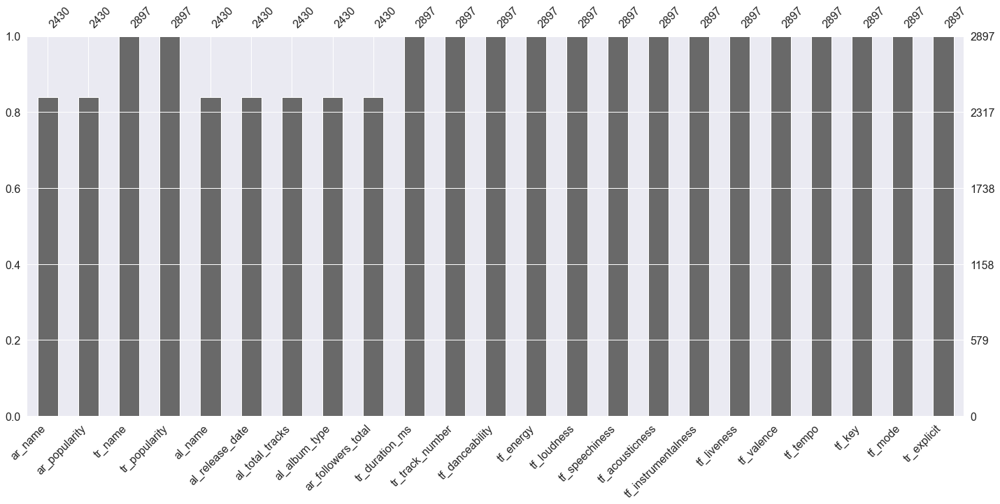

In [39]:
#Visualizing the completness of the dataset , bar chart of missing values
import missingno as msno
msno.bar(full)


## Visualize the locations of missing values
### it describes the nullity in the dataset and appears blank wherever there are missing values
### the sparkline on the right summarizes the general shape of data completness and poitns out the row with the 
#### minimum number of null values in the DataFrame and the total amount of columns

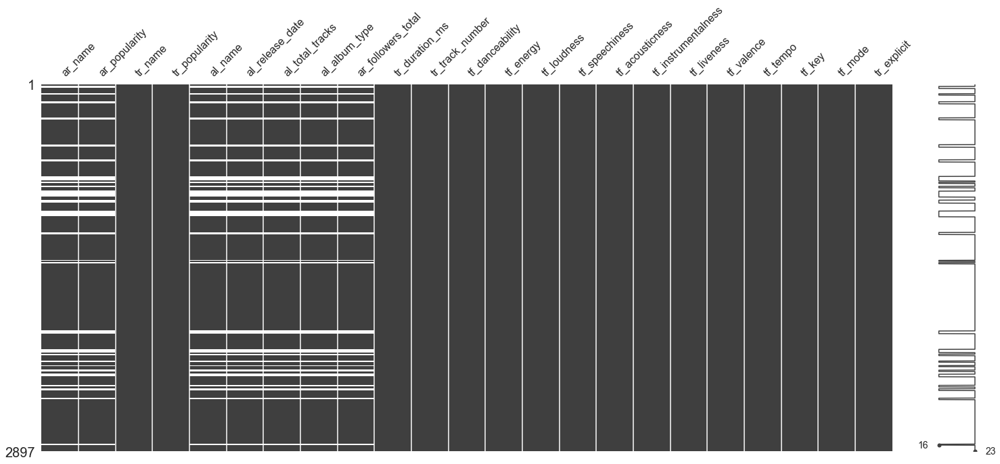

In [40]:
msno.matrix(full)

# Missingness HeatMap

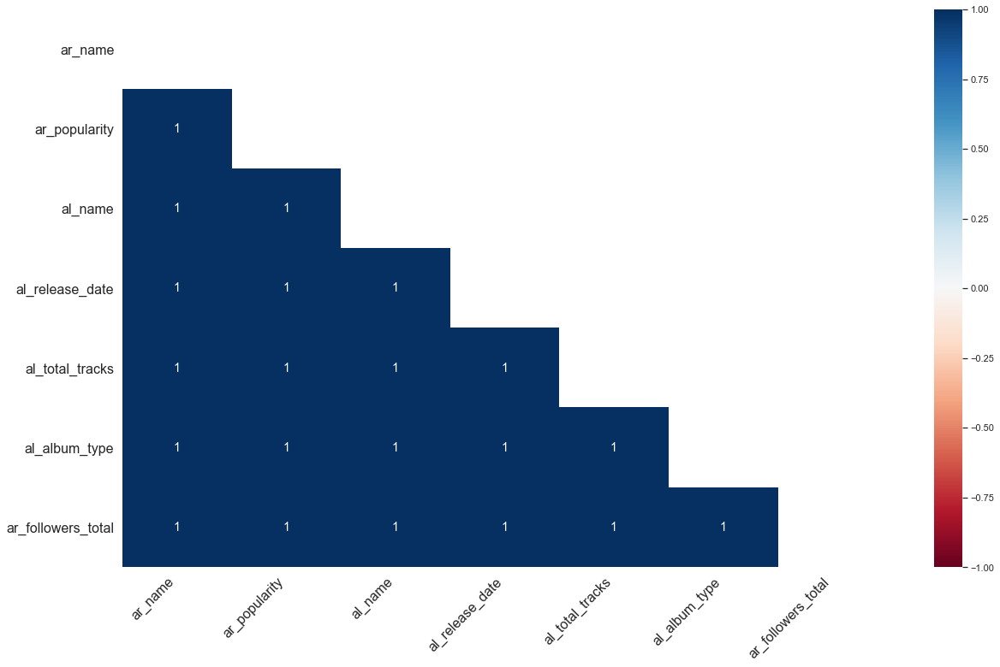

In [41]:
msno.heatmap(full)

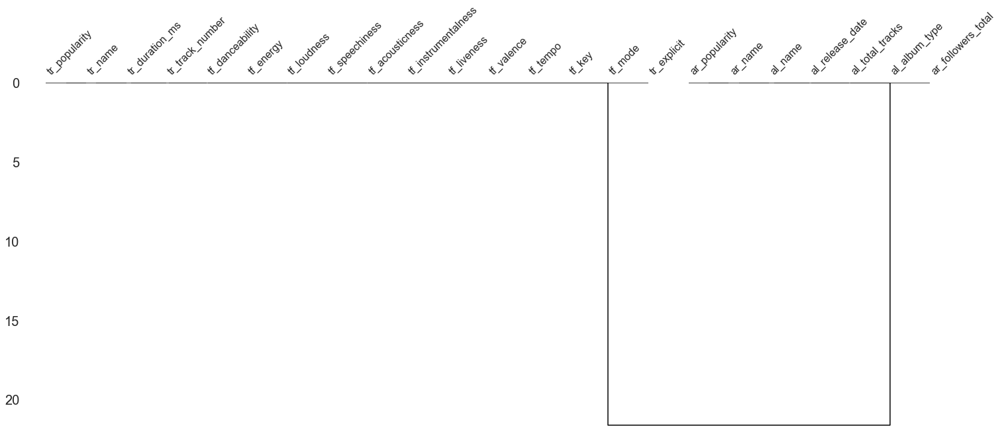

In [42]:
msno.dendrogram(full)

In [43]:
def fill_dummy_values(df, scaling_factor=0.075):
  df_dummy = full_renamed.copy(deep=True)
  for col_name in df_dummy:
    col = df_dummy[col_name]
    col_null = col.isnull()    
    # Calculate number of missing values in column 
    num_nulls = col_null.sum()
    # Calculate column range
    col_range = col.max() - col.min()
    # Scale the random values to scaling_factor times col_range
    dummy_values = (rand(num_nulls) - 2) * scaling_factor * col_range + col.min()
    col[col_null] = dummy_values

    return df_dummy

In [44]:
from numpy.random import rand
# Fill dummy values in full_renamed
full_renamed_dummy=fill_dummy_values(full_renamed)


# Sum the nullity of Skin_Fold and BMI
nullity = full_renamed.ar_popularity.isnull()+full_renamed.al_total_tracks.isnull()

# Create a scatter plot of Skin Fold and BMI 
full_renamed_dummy.plot(x='ar_popularity', y='al_total_tracks', kind='scatter', alpha=0.5, 
                    
                    # Set color to nullity of BMI and Skin_Fold
                    c=nullity, 
                    cmap='rainbow')

plt.show()

TypeError: '>=' not supported between instances of 'str' and 'float'

# Imputing Techniques

null_dataframe.dtypes

#Creating a null dataframe
nall_dataframe=full_renamed.isnull()
nall_dataframe.dtypes

In [45]:
null_dataframe_constant=full_renamed
null_dataframe_constant

,ar_name,ar_popularity,tr_name,tr_popularity,al_name,al_release_date,al_total_tracks,al_album_type,ar_followers_total,tr_duration_ms,tr_track_number,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,tf_key,mode,tr_explicit
0,Iron Maiden,77.0,"Churchill’s Speech - Live in Mexico City, Pala...",41,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,38826,1,0.3380,0.9040,-12.851,0.1610,0.433000,0.134000,0.9100,0.0394,85.128,5,0,False
1,Iron Maiden,77.0,"Aces High - Live in Mexico City, Palacio de lo...",43,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,298789,2,0.2730,0.9970,-4.956,0.1260,0.007680,0.046900,0.8520,0.0704,127.267,7,1,False
2,Iron Maiden,77.0,"Where Eagles Dare - Live in Mexico City, Palac...",41,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,312688,3,0.2370,0.9960,-4.678,0.1400,0.000254,0.102000,0.7130,0.1010,113.782,9,1,False
3,Iron Maiden,77.0,"2 Minutes To Midnight - Live in Mexico City, P...",40,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,354165,4,0.2190,0.9940,-5.088,0.1110,0.001240,0.003660,0.9440,0.1660,96.345,9,0,False
4,Iron Maiden,77.0,"The Clansman - Live in Mexico City, Palacio de...",41,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,556831,5,0.1780,0.9590,-5.648,0.0951,0.020700,0.019600,0.9370,0.1590,80.827,2,1,False
5,Iron Maiden,77.0,"The Trooper - Live in Mexico City, Palacio de ...",40,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,242325,6,0.1860,0.9950,-5.178,0.1150,0.001200,0.077900,0.9750,0.2420,175.632,4,0,False
6,Iron Maiden,77.0,"Revelations - Live in Mexico City, Palacio de ...",39,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,392277,7,0.2350,0.9820,-6.034,0.1140,0.001230,0.001960,0.9480,0.2240,80.684,9,0,False
7,Iron Maiden,77.0,For The Greater Good Of God - Live in Mexico C...,39,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,563488,8,0.2810,0.9720,-5.429,0.1870,0.003600,0.049100,0.5960,0.1590,119.308,4,0,False
8,Iron Maiden,77.0,"The Wickerman - Live in Mexico City, Palacio d...",38,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,283630,9,0.2270,0.9870,-5.091,0.1300,0.000261,0.019100,0.9030,0.1380,99.386,7,1,False
9,Iron Maiden,77.0,"Sign Of The Cross - Live in Mexico City, Palac...",38,"Nights of the Dead, Legacy of the Beast: Live ...",2020-11-20,17.0,album,6201079.0,660650,1,0.2600,0.9440,-6.455,0.0779,0.001670,0.249000,0.9440,0.1340,109.698,0,1,False


# 1st method use fillna

In [ ]:
null_dataframe_constant["ar_popularity"][17:33]=null_dataframe_constant["ar_popularity"][17:33].fillna("77")
#null_dataframe_constant.iloc[17:33]


null_dataframe_constant.iloc[17:33].head(2)


# 2nd method use replace

In [ ]:
null_dataframe_constant["ar_popularity"][75:86]=null_dataframe_constant["ar_popularity"][75:86].replace(np.nan,77)

null_dataframe_constant.iloc[75:86].head(2)


In [ ]:
null_dataframe_constant["ar_name"][75:80]=null_dataframe_constant["ar_name"][75:80].replace(np.nan,"Iron Maiden")
null_dataframe_constant.iloc[75:80].head(2)


# 3rd method replace rows based on criteria of other rows

In [ ]:
null_dataframe_constant["ar_name"]=np.where(null_dataframe_constant["ar_popularity"]==77,
                                            null_dataframe_constant["ar_name"].fillna('Iron Maiden'),
                                            null_dataframe_constant["ar_popularity"])

null_dataframe_constant.iloc[76:86].head(2)


# Making more accurate imputations

### The next 2 blocs are not useful because al name column is still missing in columns with nan values

null_dataframe_constant

from collections import Counter
print(Counter(null_dataframe_constant["al_name"]))





maid= ({'A Real Live Dead One (Live; 1998 Remaster)': 23, 'A Real Live Dead One': 23,
        'Rock in Rio (Live; 2015 Remastered Version)': 19, 'Rock In Rio [Live]': 19, 
        'Framing Armageddon - Something Wicked (Pt. 1)': 19,
        'ライヴ・イン・テキサス1989 (Live at リユニオン・アリーナ、ダラス、1989)': 19,
        "Maiden England '88 (2013 Remaster)": 18, "Maiden England '88": 18, 'Live In Brazil (1993 – 2017)': 18, 
        'Live In Argentina (1993 – 2017)': 18, 'Live In Chile (1993 – 2017)': 18, 
        'Nights of the Dead, Legacy of the Beast: Live in Mexico City': 17, 'En Vivo!': 17, 
        'En Vivo! (Live at Estadio Nacional, Santiago)': 17, 'Flight 666: The Original Soundtrack (Live)': 17, 
        'Flight 666: The Original Soundtrack': 17, 'Live After Death (1998 Remaster)': 17, 'At the Edge of Time': 17, 
        'Death on the Road': 16, 'Last Curtain Call': 16, 
         'The Book of Souls: Live Chapter': 15, 'The Book of Souls: The Live Chapter': 15,
        'Fear of the Dark (2015 - Remaster)': 12, 'Fear of the Dark (2015 Remaster)': 12,
        'The Book of Souls': 11, 'Dance of Death (2015 - Remaster)': 11, 'Dance of Death (2015 Remaster)': 11, 
        'The X Factor (2015 - Remaster)': 11, 
        'The X Factor (2015 Remaster)': 11,
        'The Final Frontier (2015 - Remaster)': 10, 'The Final Frontier (Deluxe Edition)': 10, 
        'The Final Frontier': 10, 
        'The Final Frontier (2015 Remaster)': 10, 'A Matter of Life and Death (2015 Remaster)': 10, 
        'A Matter of Life and Death (2015 - Remaster)': 10, 'Brave New World (2015 - Remaster)': 10, 
        'Brave New World (2015 Remaster)': 10, 
        'No Prayer for the Dying (2015 Remaster)': 10, 'No Prayer for the Dying (2015 - Remaster)':10,
        'Piece of Mind (2015 - Remaster)': 9, 'Piece of Mind (2015 Remaster)': 9,
       'Virtual XI (2015 - Remaster)': 8, 'Virtual XI (2015 Remaster)': 8, 
        'Seventh Son of a Seventh Son (2015 - Remaster)': 8,
        'Seventh Son of a Seventh Son (2015 Remaster)': 8, 'Somewhere in Time (2015 - Remaster)': 8,
        'Somewhere in Time (2015 Remaster)': 8, 'Powerslave (2015 - Remaster)': 8, 
        'Powerslave (2015 Remaster)': 8, 'The Number of the Beast (2015 - Remaster)': 8,})



null_dataframe_constant["ar_name"]=np.where(null_dataframe_constant["al_name"].isin(maid),
                                            null_dataframe_constant["ar_name"].fillna('Iron Maiden'),
                                            null_dataframe_constant["ar_name"])


In [ ]:
null_dataframe_constant

In [ ]:
null_dataframe_constant

from collections import Counter
print(Counter(null_dataframe_constant["tr_name"]))

### Experimenting on rows 31,32

In [ ]:
maid_tr= ({ 'The Evil That Men Do - Live in Mexico City, Palacio de los Deportes, Mexico, September 2019': 2,
          'Hallowed Be Thy Name - Live in Mexico City, Palacio de los Deportes, Mexico, September 2019': 2})

In [ ]:
null_dataframe_constant["ar_name"]=np.where(null_dataframe_constant["tr_name"].isin(maid_tr),
                                            null_dataframe_constant["ar_name"].fillna('Iron Maiden'),
                                            null_dataframe_constant["ar_name"])


In [ ]:
null_dataframe_constant

### Experimenting with interpolate nearst method in artist name didn't work

### 17-39 oxi, 33 oxi, 75-85 oxi,#265-280 oxi ,138-154 oxi#477-496 tsouk
### od course it does not work since artist name is a string value and interpolate works only for numeric and booleans

In [ ]:

null_dataframe_constant["ar_name"].interpolate(method="nearest")
null_dataframe_constant

### Experimenting with interpolate nearst method in artist name didn't work

In [ ]:
#needed to use inplace to see the results
d=null_dataframe_constant
d["ar_popularity"].interpolate(method="nearest",inplace=True)
d

In [ ]:
type(d)

In [ ]:
# artist popularity time series plot
#the plot has some gaps which need to be filled
null_dataframe_constant["ar_popularity"].plot(title="artist popularity", marker="o", figsize=(30,5))

In [ ]:
d['ar_popularity'].plot(color='red', marker='o', linestyle='dotted', figsize=(30, 5))
null_dataframe_constant['ar_popularity'].plot(title='artist popularity', marker='o')

In [ ]:
full_renamed[ (full_renamed["ar_name"]=="Iron Maiden")]#,["ar_popularity"]

In [ ]:
full_renamed.loc[(full_renamed["ar_name"]=="Iron Maiden"),"ar_popularity"]

In [ ]:
full_renamed.loc[(full_renamed["ar_name"]=="Iron Maiden")]

In [ ]:
full_renamed[ (full_renamed["ar_name"]=="Iron Maiden")]#,["ar_popularity"]

In [ ]:
#find all missing artists
full_renamed[full_renamed['ar_name'].isnull()]

In [ ]:
###to parakatw douleuei alla einai lathos thelw na kanw slice apo to 17:85 kai mono gia ar_popularity

In [ ]:
from sklearn.impute import SimpleImputer
null_dataframe_constant=full_renamed.copy(deep=True)
constant_imputer=SimpleImputer(strategy="constant", fill_value=77)
null_dataframe_constant.iloc[:,:]=constant_imputer.fit_transform(null_dataframe_constant)
null_dataframe_constant

In [ ]:
null_dataframe_constant.fillna(0,inplace=True)
#null_dataframe_constant.replace(np.nan, 0)

In [ ]:
null_dataframe_constant.iloc[17:85]

In [ ]:
# from sklearn.impute import SimpleImputer
null_dataframe_constant=full_renamed.copy(deep=True)
constant_imputer=SimpleImputer(strategy="constant", fill_value=77)
null_dataframe_constant.iloc[17:85,1]=constant_imputer.fit_transform(null_dataframe_constant)

In [ ]:
#creating a dataframe containing all null values
null=full_renamed[full_renamed.isnull().any(axis=1)]
null.shape
null


## 14.4.2021

In [ ]:
import fancyimpute


In [ ]:
from fancyimpute import KNN

I wanted to check in which ways null values can be spoted in the full_renamed DataFrame 

In [46]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [50]:
from fancyimpute import KNN
knn_imputer = KNN()
null_dataframe_constant.iloc[:, :] = knn_imputer.fit_transform(null_dataframe_constant)

AttributeError: 'KNN' object has no attribute 'fit_transform'

In [51]:

from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3)
null_dataframe_constant.iloc[:, :] = imputer.fit_transform(null_dataframe_constant)

ValueError: could not convert string to float: 'Iron Maiden'

In [9]:
import scikit-learn


SyntaxError: invalid syntax (<ipython-input-9-56e12c41cf9d>, line 1)

In [8]:
import sklearn

In [10]:
print('The scikit-learn version is {}.'.format(sklearn.__version__))

The scikit-learn version is 0.24.1.


In [48]:
from sklearn.impute import KNNImputer

## 18.4.2021

In [ ]:
null_dataframe_constant.head(1)

In [ ]:
from scikit-learn.neighbors import KNN
knn_imputer=KNN()
null_dataframe_constant.iloc[:, :]=knn_imputer.fit_transform(null_dataframe_constant)

## 17.4.2021

In [ ]:
# Getting the rows from the above dataset
#iterating over indices

for row in null.index:
    print(row, end = " ")

In [ ]:
#getting a list of indexes
list(null.index.values)

In [ ]:
#tolist() method
list(null.index.values.tolist())

In [ ]:
dokimi=null

In [ ]:
dokimi.loc[[17,18].replace({dokimi["ar_name"]:"Iron"})
dokimi.loc[[17,18]]

In [ ]:
dokimi.loc[[17,18].replace(dokimi["ar_name"],"Iron")
dokimi.loc[[17,18]

In [ ]:
dokimi.assign(dokimi["ar_name"]='foo')
dokimi.loc[[17,18]]

In [ ]:
dok=pd.read_csv("C:/Users/Dimitris/Desktop/project spotify/testlargefiles/data/adulthood/adulthood_dataframe.csv"
             ,index_col="tr_name")
#TypeError: Only booleans, lists, and dictionaries are accepted for the 'parse_dates' parameter

In [ ]:
dok.head(2)

In [ ]:
type("al_release_date")

## ADDING NEW FEATURES(variables)

### a)Creating feature "language"

In [ ]:
#Creating a new dataframe, new_features_added

new_features_added=iron_maiden

#making a list with artist names

ar_names_keys = new_features_added.ar_name.map(lambda x : x if isinstance(x, list) else [x]).explode().unique().tolist()
print (ar_names_keys)

#preparing the creation of language feature
#all values were manually added

values=["en","gr","en","gr","gr","en","gr","en","gr","gr","gr","en","gr","gr","gr","gr","gr","en","gr","gr","en","en","gr","gr",
#ffc       
        "gr","en","en","gr","gr","gr","gr","gr","en","gr","gr","gr","gr","gr","en","gr","gr","gr","en","gr","gr","gr","gr",
#Loconondo
        "gr","gr","gr","en","gr","en","en","gr","gr","en","gr","gr","gr","en",
#Mwra
        "gr","gr","en","gr","gr","en","en","gr","en","gr",
#Omixli
       "gr","gr","gr","gr","gr","en",
#proffesion
        "gr","gr","en","en",
#rodes
        "gr","en","en","en","gr","en","en",
#night
        "en","en","en","gr","gr","gr","gr",
#taf
       "gr","gr","en","gr","en","en",
#sailing
        "en","gr","gr","gr","gr","gr","gr",
#vagina
        "en","gr","gr","en","gr","gr",
#xylina
        "gr","en","gr","gr","en","en",
#m3mphis
        "gr","gr"]

# creating a dictionary that matches artists and the corresponding language

dictionary = dict(zip(ar_names_keys, values))
dictionary

#mapping dictionary with "language"  feature of "new_features_added" DataFrame

new_features_added["language"] =new_features_added['ar_name'].map(dictionary) 
new_features_added.head(1)

# checking how many values per language
# Of the total 119 greek bands that were selectedm 41 of them were playng songs in English whereas 78 of them in Greek.
#65 of the bands were using greek language

new_features_added.groupby("language")["ar_name"].nunique()

### b)Creating feature "lyrics"

In [ ]:
con = [
    (new_features_added["instrumentalness"]>0.800) & (new_features_added["speechiness"]<0.0400 ),
    new_features_added["instrumentalness"]<0.800 ,
]

In [ ]:
out = ["no_lyrics", "lyrics"]

In [ ]:
result = np.select(con, out)
pd.Series(result)

In [ ]:
new_features_added["have_lyrics"]=result

In [ ]:
q=new_features_added.iloc[[31,36,43,55,282,300,375,391,640,652],:]
q

In [ ]:
i=new_features_added.iloc[[282,300],:]
i

### c).Creating feature "tracks_per_artist"

In [ ]:
#This option will give you a column with repeated values of the counts,
#corresponding to the frequency of each value in the 'Color' column.

z = new_features_added['ar_name'].value_counts() 

#converts to dictionary
z1 = z.to_dict() 

new_features_added['tracks_per_artist'] = new_features_added['ar_name'].map(z1) 
new_features_added.head(1)

In [ ]:
# checking total tracks per artist

new_features_added.groupby("ar_name")["tracks_per_artist"].count().sort_values(ascending=False)


In [ ]:
#Filtering DataFrame by ar_name & total tracks per artist

new_features_added.groupby(["ar_name","tracks_per_artist"]).sum().sort_values(by="tracks_per_artist",ascending=False)

#explicit.groupby(['ar_name',"tr_name"])['tr_popularity'].sum()

## CREATING DATAFRAMES FILTERED BY NEW ADDED FEATURES

### Creating "english" DataFrame , consisting of tracks in english

In [ ]:
english=new_features_added[new_features_added["language"]=="en"]

In [ ]:
english.shape

### Creating "greek" DataFrame , consisting of tracks in greek

In [ ]:
greek=new_features_added[new_features_added["language"]=="gr"]

In [ ]:
greek.shape

### Creating "no_lyr" DataFrame , consisting of non lyrics track

In [ ]:
no_lyr=new_features_added[new_features_added["have_lyrics"]=="no_lyrics"]

In [ ]:
no_lyr.shape


### Creating "lyr" DataFrame, consisting of tracks with lyrics

In [ ]:
lyr=new_features_added[new_features_added["have_lyrics"]=="lyrics"]

In [ ]:
lyr.shape


### Creating "explicit" DataFrame, consisting of tracks with explicit lyrics

In [ ]:
explicit=new_features_added[new_features_added["tr_explicit"]==True]

In [ ]:
explicit.shape

### Creating "non_explicit" DataFrame,, consisting of tracks with non explicit lyrics

In [ ]:
non_explicit=new_features_added[new_features_added["tr_explicit"]==False]

In [ ]:
non_explicit.shape

## ENCODING ADDED FEATURES("language,lyrics,explicit_lyrics"), IN BINARY VARIABLES

#### encoding is used to enable further analysis , in order to examine IF & HOW new, added feautres are correlated with each other,
#### but to the rest of the feautures as well.

## Encoding variable "language"

In [ ]:
#  1=english & 0=greek

new_features_added["lang_encoded"]=new_features_added["language"].apply(lambda val:
                                              1 if val=="en" else 0)

## Encoding variable "lyrics"

In [ ]:
#  1=lyrics & 0=no_lyrics    

#importing LabelEncoder
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()
new_features_added["lyr_encoded"]=le.fit_transform(new_features_added["have_lyrics"])

## Encoding variable "explicit_lyrics"

In [ ]:
#  1=explicit & 0=non_explicit

from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()
new_features_added["explicit_encoded"]=le.fit_transform(new_features_added["tr_explicit"])

In [ ]:
#Inspecting shape after encoding variables

new_features_added.shape

In [ ]:
new_features_added.head(1)


In [ ]:
#creating a new DataFrame "features" including only quantative data thus the  encoded variables as well
#"features" DataFrame will also be later used for machine learning models

features=new_features_added[["ar_popularity","tr_popularity","al_total_tracks",
"al_popularity","ar_followers_total","tr_duration_ms","tr_track_number","tf_danceability","tf_energy","tf_loudness",
"tf_speechiness","tf_acousticness","tf_instrumentalness","tf_liveness","tf_valence","tf_tempo","tf_mode","tf_key",
   "tf_time_signature","lang_encoded","lyr_encoded","explicit_encoded","tracks_per_artist"]]

## C.EXLPLORATORY DATA ANALYSIS

### EXAMINING CORRELATIONS

In [ ]:
corr = features.corr()
f, ax = plt.subplots(figsize=(12,9))
sns.set(font_scale=1.25)
hm = sns.heatmap(corr, cmap="YlGnBu", annot=True, fmt='.2f', annot_kws={'size': 10})
plt.tight_layout()


In [ ]:
corr.style.background_gradient().set_precision(2)

## PLOTTING ECDF's

##  Ecdf danceability


In [ ]:
#60% of the tracks have 60% or less danceability meaning that only 40% of tracks have danceabilty >60%
x=np.sort(full["tf_danceability"])
y=np.arange(1,len(x)+1)/len(x)
_=plt.plot(x,y,marker=".",linestyle="none")
_=plt.xlabel("danceability")
_=plt.ylabel("ECDF")
plt.margins(0.02)
plt.show()


##  Ecdf valence

In [ ]:
#50% of the tracks have 50% or less valence  

np.sort(full["tf_valence"])
y=np.arange(1,len(x)+1)/len(x)
_=plt.plot(x,y,marker=".",linestyle="none")
_=plt.xlabel("valence")
_=plt.ylabel("ECDF")
plt.margins(0.02)
plt.show()

## Ecdf of track popularity

In [ ]:
#60% of the tracks have 60% or less  popularity  or 
#40% of the tracks have more than 60% popularity

np.sort(full["tr_popularity"])
y=np.arange(1,len(x)+1)/len(x)
_=plt.plot(x,y,marker=".",linestyle="none")
_=plt.xlabel("track popularity")
_=plt.ylabel("ECDF")
plt.margins(0.02)
plt.show()

In [ ]:
#80% of the artists have <20.000 followers

x=np.sort(full["ar_followers_total"])
y=np.arange(1,len(x)+1)/len(x)
_=plt.plot(x,y,marker=".",linestyle="none")
_=plt.xlabel("followers")
_=plt.ylabel("ECDF")
plt.margins(0.02)
plt.show()


In [ ]:
#20% of the tracks have 40% or less energy level

x=np.sort(full["tf_energy"])
y=np.arange(1,len(x)+1)/len(x)
_=plt.plot(x,y,marker=".",linestyle="none")
_=plt.xlabel("energy")
_=plt.ylabel("ECDF")
#plt.margins(0.02)
#plt.show()

In [ ]:
def ecdf(dataframe):
    
    """Compute ECDF """
    # Number of data points: n
    n = len(dataframe)

    # x-data for the ECDF: x
    x = np.sort(dataframe)

    # y-data for the ECDF: y
    y = np.arange(1, n+1) / n

    return x, y

In [ ]:
#COMPARISON OF ECDF's
# Compute ECDFs

x_val, y_val=ecdf(new_features_added["tf_valence"])
x_enrg, y_enrg=ecdf(new_features_added["tf_energy"])
x_danc,y_danc=ecdf(new_features_added["tf_danceability"])
x_instr,y_instr=ecdf(new_features_added["tf_instrumentalness"])

x_acoust,y_acoust=ecdf(new_features_added["tf_acousticness"])
x_speech,y_speech=ecdf(new_features_added["tf_speechiness"])





# Plot all ECDFs on the same plot

_ = plt.plot(x_val, y_val, marker = '.', linestyle = 'none')
_ = plt.plot(x_enrg, y_enrg, marker = '.', linestyle = 'none')
_ = plt.plot(x_danc,y_danc, marker = '.', linestyle = 'none')
_ = plt.plot(x_instr,y_instr, marker = '.', linestyle = 'none')
_ = plt.plot(x_acoust,y_acoust, marker = '.', linestyle = 'none')
_ = plt.plot(x_speech,y_speech, marker = '.', linestyle = 'none')




# Annotate the plot
plt.legend(('valence', 'energy', 'danceability','instrumentalness','acousticness','speechiness','loudness'), loc='lower right')
_ = plt.xlabel('tracks_features')
_ = plt.ylabel('ECDF')


plt.show()

In [ ]:
#x_loud,y_loud=ecdf(new_features_added["tf_loudness"])
x_dur,y_dur=ecdf(new_features_added["tr_duration_ms"])

#_ = plt.plot(x_loud,y_loud, marker = '.', linestyle = 'none')
_ = plt.plot(x_dur,y_dur, marker = '.', linestyle = 'none')

# Annotate the plot
plt.legend(('track durations'), loc='lower right')
_ = plt.xlabel('tracks_features')
_ = plt.ylabel('ECDF')


plt.show()

## Ecdf "language" feature

In [ ]:
# language
#1= english,0=greek
#~65% of tracks are in greek while 35% of them are in english


x=np.sort(full["lang_encoded"])
y=np.arange(1,len(x)+1)/len(x)
_=plt.plot(x,y,marker=".",linestyle="none")
_=plt.xlabel("gr vs en")
_=plt.ylabel("ECDF")
#plt.margins(0.02)
#plt.show()

## Ecdf "explicit lyrics" feauture

In [ ]:
#  1=explicit & 0=non_explicit
#Only a few songs contain explicit content

x=np.sort(full["explicit_encoded"])
y=np.arange(1,len(x)+1)/len(x)
_=plt.plot(x,y,marker=".",linestyle="none")
_=plt.xlabel("non explicit vs explicit")
_=plt.ylabel("ECDF")
#plt.margins(0.02)
#plt.show()

In [ ]:
#Most numbers of songs have energy between 0.6-0.8 while most songs are at the danceability of 0.5-0.7
sns.jointplot(x="tf_energy",y="tf_danceability",data=full[["tf_energy","tf_danceability"]],
              kind="hex").set_axis_labels("energy","danceability")

In [ ]:
#Boxploting features

sns.set() # Used to set the default seaborn theme, scaling and colour pallete 

f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.boxplot(full['al_total_tracks'], ax=axes[0])
sns.boxplot(full['ar_followers_total'], ax=axes[1])
sns.boxplot(full['al_popularity'], ax=axes[2])


f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.boxplot(full['ar_popularity'], ax=axes[0])
sns.boxplot(full['tf_acousticness'], ax=axes[1])
sns.boxplot(full['tf_danceability'], ax=axes[2])


f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.boxplot(full['tf_energy'], ax=axes[0])
sns.boxplot(full['tf_instrumentalness'], ax=axes[1])
sns.boxplot(full['tf_liveness'], ax=axes[2])

f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.boxplot(full['tf_loudness'], ax=axes[0])
sns.boxplot(full['tf_speechiness'], ax=axes[1])
sns.boxplot(full['tf_tempo'], ax=axes[2])

f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.boxplot(full['tf_valence'], ax=axes[0])
sns.boxplot(full['tr_track_number'], ax=axes[1])
sns.boxplot(full['tr_duration_ms'], ax=axes[2])

f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.boxplot(full['tf_key'], ax=axes[0])
sns.boxplot(full['tf_mode'], ax=axes[1])
sns.boxplot(full['tf_time_signature'], ax=axes[2])


plt.show()

## CLEANING DATA AND PREPROCESSING

In [ ]:
#checking num values
new_features_added.isnull().values.sum()

In [ ]:
new_features_added.isnull().sum()

In [ ]:
#creating a new dataframe consisting of all the null entries.
#that way i can examine what kind of values are missing thus helping me determine the way of handling them
null_data = new_features_added[new_features_added.isnull().any(axis=1)]
null_data.shape

In [ ]:
null_data.head(1)

## Inspecting null data for later investigation

In [ ]:
null_data.index.tolist()

## Creating DataFrames consist of the values without "ar_names" for later investigation

In [ ]:

who1=new_features_added.iloc[173:189]
who2=new_features_added.iloc[596:604]
who3=new_features_added.iloc[1153:1201]
who4=new_features_added.iloc[1536:1576]
who5=new_features_added.iloc[2200:2299]
who6=new_features_added.iloc[2433:2494]
who7=new_features_added.iloc[2676:2680] 
who8=new_features_added.iloc[2833:2836] 
who9=new_features_added.iloc[3539:3543] 
who10=new_features_added.iloc[3656:3658]
who11=new_features_added.iloc[4057:4087]
who12=new_features_added.iloc[7045:7049] 
who13=new_features_added.iloc[7059:7107]
who14=new_features_added.iloc[7552:7558]
who15=new_features_added.iloc[7567:7575] 
who16=new_features_added.iloc[9312:9316]
who17=new_features_added.iloc[9818:9830] 
who18=new_features_added.iloc[11534:11545] 
who19=new_features_added.iloc[13626:11579] 

### null data will be further examined later on 
### -null values will be replaced and filled with the appropriate stragegy-, 
### but for the time being all of them will be removed


## ANALYSING DATA, FINDING PATTERNS, MAKING AD HOC QUERIES

### Creating "analysis" DataFrame that will be used for ad hoc queries.

### First of all i want to examine the variation of tracks's features and how they changed through time.
### For that reason,i created "analysis" DataFrame that uses "al_release_date" feature as index.

In [ ]:
analysis=new_features_added

In [ ]:
analysis.set_index(pd.DatetimeIndex(full['al_release_date']), inplace = True)
analysis.sort_index(inplace=True)

In [ ]:
first_dec= analysis.loc["1980-01-01":"1989-12-31"]
sec_dec= analysis.loc["1990-01-01":"1999-12-31"]
third_dec=analysis.loc["2000-01-01":"2009-12-31"]
fourth_dec=analysis.loc["2010-01-01":"2019-12-31"]



In [ ]:
# Create a figure
plt.style.use('fivethirtyeight')

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(30, 30))
ax1, ax2, ax3, ax4 = axes.flatten()
fig.subplots_adjust(hspace=.2, wspace=.5)

# top left
first_dec.mean().plot.barh(ax=ax1, colormap='magma', fontsize=20)
ax1.set_xlim(-15,100)

# top right
sec_dec.mean().plot.barh(ax=ax2, colormap='gist_rainbow', fontsize=20)
ax2.set_xlim(-15,100)

# bottom left
third_dec.mean().plot.barh(ax=ax3, colormap='terrain', fontsize=20)
ax3.set_xlim(-15,100)


# bottom right
fourth_dec.mean().plot.barh(ax=ax4, colormap='ocean', fontsize=20)
ax4.set_xlim(-15,100)

# Create axis titles
ax1.set_title('1980-1989')
ax2.set_title('1990-1999')
ax3.set_title('2000-2009')
ax4.set_title('2010-2019')

plt.show()

#### Since the visualized features are kind of blurry to be interpreted in the above graph, i attempted a tabular comparison

In [ ]:
first = pd.DataFrame(first_dec.mean(), columns= ['1980-1989'])
sec = pd.DataFrame(sec_dec.mean(), columns= ['1990-1999'])
third = pd.DataFrame(third_dec.mean(), columns= ['2000-2009'])
fourth= pd.DataFrame(fourth_dec.mean(), columns= ['2010-2019'])

full_period = pd.concat([first,sec,third,fourth], axis=1)
full_period

In [ ]:
##Plotting change of danceability through time

fig, ax = plt.subplots(figsize = (15,7))
ax.set_xlabel("al_release_date",fontsize = 13)
ax.set_ylabel("danceability", fontsize = 13) 
ax.set_title("danceability between 1980-2019", fontsize = 20 )

analysis["tf_danceability"].resample("Q").median().plot()

avg = analysis["tf_danceability"].median()
ax.axhline(y=avg, color='r', label='Average', linestyle='--', linewidth=2)
plt.show()


In [ ]:
## Plotting change of valence through time

fig, ax = plt.subplots(figsize = (15,7))
ax.set_xlabel("al_release_date", fontsize = 13)
ax.set_ylabel("Valence", fontsize = 13) 
ax.set_title("Valence between 1980-2019", fontsize = 20 )

analysis["tf_valence"].resample("Q").median().plot()

avg = analysis["tf_valence"].median()
ax.axhline(y=avg, color='r', label='Average', linestyle='--', linewidth=2)
plt.show()


In [ ]:
## Plotting change of energy through time

fig, ax = plt.subplots(figsize = (15,7))
ax.set_xlabel("al_release_date", fontsize = 13)
ax.set_ylabel("Energy", fontsize = 13) 
ax.set_title("Energy between 1980-2019", fontsize = 20 )

analysis["tf_energy"].resample("Q").median().plot()

avg = analysis["tf_energy"].median()
ax.axhline(y=avg, color='r', label='Average', linestyle='--', linewidth=2)
plt.show()


In [ ]:
## Plotting change of accousticness through time

fig, ax = plt.subplots(figsize = (15,7))
ax.set_xlabel("al_release_date", fontsize = 13)
ax.set_ylabel("Acousticness", fontsize = 13) 
ax.set_title("Acousticness between 1980-2019", fontsize = 20 )

analysis["tf_acousticness"].resample("Q").median().plot()

avg = analysis["tf_acousticness"].median()
ax.axhline(y=avg, color='r', label='Average', linestyle='--', linewidth=2)
plt.show()


In [ ]:
## Plotting feature's densities


f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.distplot(new_features_added['tf_danceability'], ax=axes[0], color="blue")
sns.distplot(new_features_added['tf_energy'], ax=axes[1],color="blue")
sns.distplot(new_features_added['tf_loudness'], ax=axes[2],color="blue")


f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.distplot(new_features_added['tf_speechiness'], ax=axes[0],color="blue")
sns.distplot(new_features_added['tf_acousticness'], ax=axes[1],color="blue")
sns.distplot(new_features_added['tf_valence'], ax=axes[2],color="blue")


f, axes = plt.subplots(1, 3, sharey=True, figsize=(15, 4))
sns.distplot(new_features_added['tf_loudness'], ax=axes[0],color="blue")
sns.distplot(new_features_added['ar_popularity'], ax=axes[1],color="blue")
sns.distplot(new_features_added['tf_instrumentalness'], ax=axes[2],color="blue")
plt.show()


## Classifying features --same method can be applied to all features

In [ ]:
high_danc=analysis['tf_danceability']>=0.70
med_danc=(analysis['tf_danceability']>=0.5) & (analysis['tf_danceability']<0.70)
low_danc=analysis['tf_danceability']<0.49



In [ ]:
data=[high_danc.sum(),med_danc.sum(),low_danc.sum()]
danc=pd.DataFrame(data,columns=['counts'],
                   index=['High danceability','Medium Danceability','Low Danceability'])
danc



## Tracks per Artist

### Since index is determined by al_release_date it should be reset

In [ ]:
analysis.reset_index(drop=True, inplace=True)

In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
analysis.ar_name.value_counts()

## Plotting artists

In [ ]:
analysis.ar_name.value_counts().head(20).plot(kind='barh')
plt.title('Total Tracks per Artist')
plt.show()

## Comparing the DataFrames that were created previously based on feature engineering

### lyrics VS no_lyrics

In [ ]:
first = pd.DataFrame(lyr.mean(),columns= ['lyrics'])
sec = pd.DataFrame(no_lyr.mean(),columns= ['no_lyrics'])

comparing_lyrics_vs_no_lyrics = pd.concat([first,sec], axis=1)
comparing_lyrics_vs_no_lyrics




### english VS greek


In [ ]:
first = pd.DataFrame(english.mean(),columns= ['english_lyrics'])
sec = pd.DataFrame(greek.mean(),columns= ['greek_lyrics'])

comparing_eng_vs_greek = pd.concat([first,sec], axis=1)
comparing_eng_vs_greek


### explicit VS non_explicit

In [ ]:


first = pd.DataFrame(explicit.mean(),columns= ['explicit_lyrics'])
sec = pd.DataFrame(non_explicit.mean(),columns= ['non_explicit_lyrics'])

comparing_eng_vs_greek = pd.concat([first,sec], axis=1)
comparing_eng_vs_greek

## TURN MILISECONDS TO MINUTES

##### It's easier to interpret information in a more common way of  depicting track duration

In [ ]:
analysis.head(1)

In [ ]:
analysis['duration_minutes'] = pd.to_timedelta(analysis['tr_duration_ms'], unit='ms')
analysis.head(1)

#  TOP 20 tracks with regards to features

In [ ]:
top_20 = analysis[['ar_name','ar_popularity','tr_name','tr_popularity','al_name','al_release_date','al_album_type',
                     'al_total_tracks', 'al_popularity','ar_followers_total','tr_duration_ms',
                    'tf_danceability','tf_energy','tf_loudness','tf_speechiness','tf_acousticness',
                    'tf_instrumentalness','tf_liveness','tf_valence','tf_tempo','tf_key','tf_mode','tr_explicit',
         'tf_time_signature','ar_genres','al_album_type',"duration_minutes"]]

# 'tr_disc_number'

## Top positive tracks

In [ ]:
top_20[['ar_name',"tr_name",'tf_valence']].sort_values(by='tf_valence',ascending=False).head(20)

In [ ]:
analysis.describe()

## Top Sad Tracks

In [ ]:
top_20[['ar_name',"tr_name",'tf_valence']].sort_values(by='tf_valence',ascending=False).tail(60)

## Top energetic Tracks

In [ ]:
top_20[['ar_name',"tr_name",'tf_energy']].sort_values(by='tf_energy',ascending=False).head(20)

## Top sluggish tracks

In [ ]:
top_20[['ar_name',"tr_name","tr_explicit"]].sort_values(by="tr_explicit",ascending=True).tail(40)

## Top accoustic Tracks

In [ ]:
top_20[['ar_name',"tr_name",'tf_acousticness']].sort_values(by='tf_acousticness',ascending=False).head(20)

In [ ]:
## Top length in Tracks

In [ ]:
top_20[['ar_name',"tr_name",'duration_minutes']].sort_values(by='duration_minutes',ascending=False).head(30)

## top popular tracks

In [ ]:
top_20[['ar_name',"tr_name",'tr_popularity']].sort_values(by='tr_popularity',ascending=False).head(20)

## Popularity in genres

### Finding in top20 popular tracks, which genres are prevailing

In [ ]:
top20=top_20[['tr_name','ar_genres','tr_popularity']].sort_values(by='tr_popularity',ascending=False).head(20)
top20

In [ ]:
print(Counter(top20['ar_genres'].values))
print(dict(Counter(top20['ar_genres'].values).most_common(5)))

In [ ]:
fig, ax = plt.subplots(figsize=(30, 10))
bar_plot = dict(Counter(top20['ar_genres'].values).most_common(5))
plt.bar(*zip(*bar_plot.items()))
plt.show()

## POPULARITY IN TRACKS

## Are tracks in english more popular?

In [ ]:
new_features_added[["ar_popularity", "language"]].groupby("language").mean()

## Are tracks in english happier?

In [ ]:
new_features_added[["tf_valence", "language"]].groupby("language").mean()

## Are tracks in english more energetic?

In [ ]:
new_features_added[["tf_energy", "language"]].groupby("language").mean()

In [ ]:
new_features_added[["tf_speechiness", "language"]].groupby("language").mean()

In [ ]:
new_features_added[["tr_explicit", "language"]].groupby("language").mean()

In [ ]:
new_features_added[["tf_valence", "have_lyrics"]].groupby("have_lyrics").mean()

In [ ]:
new_features_added[["tf_energy", "have_lyrics"]].groupby("have_lyrics").mean()

In [ ]:
new_features_added[["tf_loudness", "have_lyrics"]].groupby("have_lyrics").mean()

## 20 MOST POPULAR ARTISTS

In [ ]:
great=analysis
great=great.sort_values("ar_popularity",ascending=False).drop_duplicates("ar_name").sort_index()

In [ ]:
most_pop=great[["ar_name","ar_popularity"]].sort_values(by="ar_popularity",ascending=False).head(20)
most_pop

In [ ]:

most_pop.plot.bar(x="ar_name",y="ar_popularity", title="Top 20 popular artists",color="green")

#plt.title("Mince Pie Consumption Study Results")
#plt.xticks(rotation=30, horizontalalignment="center")
plt.xlabel("Artist Name")
plt.ylabel("Popularity")
plt.show()

In [ ]:
analysis.head(1)

In [ ]:
#Tracks popularity
#Creating a "track_popularity" DataFrame
track_popularity=analysis.sort_values("tr_popularity",ascending=False)

In [ ]:
track_popularity.head(20)

## How many genres do we have?

In [ ]:
from collections import Counter
print(Counter(analysis.ar_genres.values))

### which are the most common genres?

In [ ]:
print(Counter(analysis["ar_genres"].values).most_common(5))

In [ ]:
dokimi=analysis["ar_name"].astype(str)

In [ ]:
import matplotlib.pyplot as plt
#plt.style.use('ggplot')
#plt.style.use('seaborn-dark-palette')

bar_plot=dict(Counter(dokimi.values).most_common(5))
plt.bar(*zip(*bar_plot.items()))
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(30, 10)) 
genres=analysis["ar_genres"].astype(str)
import matplotlib.pyplot as plt
bar_plot=dict(Counter(genres.values).most_common(5))
plt.bar(*zip(*bar_plot.items()))
plt.show()

In [ ]:
# Another way of counting tracks per artist
print(Counter(analysis.ar_name.values))

In [ ]:
analysis.head(1)

In [ ]:
top_artist_by_track=analysis[["ar_name","tracks_per_artist"]].sort_values("tracks_per_artist",ascending=False)

In [ ]:
plt.figure(figsize=(10,5))
chart=sns.barplot("ar_name","tracks_per_artist",data=top_artist_by_track)
chart.set_xticklabels(chart.get_xticklabels(),rotation=45)
chart.set(xlabel="artist",ylabel="Number of Songs")

## BOXPLOTS OBSERVING HOW LYRICS INFUENCE features

In [ ]:
lyrics = pd.concat([lyr, no_lyr])    
lyrics.shape

### Boxplot comparing band popularity, between english and greek bands with/without lyrics

In [ ]:
plt.figure(figsize=(30,10))

ax = sns.boxplot(x="language",y="ar_popularity", hue="have_lyrics", data=lyrics)    
plt.show()

### Boxplot comparing valence between english and greek bands with/without lyrics

In [ ]:
plt.figure(figsize=(30,10))

p=ax = sns.boxplot(x="language",y="tf_valence", hue="have_lyrics", data=lyrics)    
plt.show()

### Boxplot comparing energy between english and greek bands with/without lyrics

In [ ]:
plt.figure(figsize=(30,10))

p=ax = sns.boxplot(x="language",y="tf_energy", hue="have_lyrics", data=lyrics)    
plt.show()

## FINDING BANDS WITH GREATEST MEAN OF VALANCE,ENERGY, etc

## Top 10 positive bands

### Calculating the mean valence per artist.

In [ ]:
great['valence'] = great['tf_valence'].groupby(great['ar_name']).transform('mean')

#we use drop_duplicates method, otherways "valence" will be shown in every track
#Creating "positive" DataFrame with the mean of valence per artist

positive=great.sort_values(by="valence",ascending=False).drop_duplicates("ar_name").head(10)




In [ ]:
#top 10 energetic bands have values >0.62

positive=positive.loc[positive["valence"]>0.62]
positive.head(10)

### 3 Different ways of plotting positive bands

In [ ]:
#plt.figure(figsize=(10,6))
fig, ax = plt.subplots(figsize = (20,10))


x = positive["ar_name"]
y = positive["valence"]
sns.barplot(x ='ar_name', y='tf_valence',data=positive,order=positive.sort_values("tf_valence",ascending=False).ar_name)
            #positive.plot(x ='ar_name', y='tf_valence', kind = 'barh',figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)
plt.title('Top 10 positive bands (barplot)',fontsize=8)
plt.xlabel('artist name', size=15)
plt.ylabel('valence', size=15)

plt.tight_layout()
plt.show()

In [ ]:
#Creating a barplot
sns.set(font_scale = 3)

x = positive["ar_name"]
y = positive["valence"]
positive.plot(x ='ar_name', y='tf_valence', kind = 'barh',figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=22)
plt.title('Top 10 positive bands (barplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('valence', fontsize=22)
plt.show()


In [ ]:
#Creating a lineplot
ax = plt.gca()
sns.set(font_scale = 3)
ax.plot(x,y)

positive.plot(legend=True, kind='line',x='ar_name',y='valence',ax=ax,figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)

plt.title('Top 10 positive(lineplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('positiveness', fontsize=22)
plt.show()


## Top 10 most energetic bands


### Calculating the mean energy per artist.

In [ ]:
great['energy'] = great['tf_energy'].groupby(great['ar_name']).transform('mean')

#we use drop_duplicates method, otherways "energy" will be shown in every track
#Creating "energy" DataFrame with the mean of valence per artist

energy=great.sort_values(by="energy",ascending=False).drop_duplicates("ar_name").head(10)

In [ ]:
#top 10 energetic bands have values >0.81
energy=energy.loc[energy["energy"]>0.81]
energy.head(2)

### 3 Different ways of plotting high energy bands

In [ ]:

#plt.figure(figsize=(10,6))
fig, ax = plt.subplots(figsize = (20,10))


sns.barplot(x ='ar_name', y='tf_energy',data=positive,order=positive.sort_values("tf_energy",ascending=False).ar_name)
            #positive.plot(x ='ar_name', y='tf_valence', kind = 'barh',figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)
plt.title('Top 10 positive bands (barplot)',fontsize=8)
plt.xlabel('artist name', size=15)
plt.ylabel('valence', size=15)

plt.tight_layout()
plt.show()

In [ ]:
#Creating a barplot
sns.set(font_scale = 2)
x = energy["ar_name"]
y = energy["energy"]

energy.plot(x ='ar_name', y='energy', kind = 'barh',figsize=(20,10))


ax.set_xticklabels(x, rotation=0, fontsize=10)

plt.title('Top 10 high energybands (barplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('energy', fontsize=22)
plt.show()


In [ ]:
#Creating a lineplot
ax = plt.gca()
sns.set(font_scale = 3)
ax.plot(x,y)

positive.plot(legend=True, kind='line',x='ar_name',y='valence',ax=ax,figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)

plt.title('Top 10 positive(lineplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('positiveness', fontsize=22)
plt.show()


## TOP 20 POPULAR BANDS

In [ ]:
#in the previous shell we dropped duplicated to find the unique values.now i want all tracks of the 20 most popular 
#that's why i am not using drop duplicates
#popular=great
#popular["art_popularity"]=full_pop["ar_popularity"].groupby(full_pop["ar_name"]).transform("mean")

#popular.head(10)

great['art_popularity'] = great['ar_popularity'].groupby(great['ar_name']).transform('mean')

popular=great.sort_values(by="art_popularity",ascending=False).drop_duplicates("ar_name").head(30)


In [ ]:
# top  most popular bands with values>36
popular=popular.loc[popular["art_popularity"]>36]
#popular.head(20)

In [ ]:
popular.ar_name.unique()

great=new_features_added
great["art_popularity"]=great["ar_popularity"].groupby(great["ar_name"]).transform("mean")
ar_pop=great.sort_values(by="art_popularity",ascending=False).drop_duplicates("ar_name").head(20)

#top 20 most popular bands with values>36
ar_pop=ar_pop.loc[ar_pop["art_popularity"]>36]
ar_pop.head(2)

### 3 Different ways of plotting popular bands

In [ ]:

#plt.figure(figsize=(10,6))
fig, ax = plt.subplots(figsize = (20,10))


sns.barplot(x ='ar_name', y='ar_popularity',data=popular,order=popular.sort_values("ar_popularity",ascending=False).ar_name)
            

ax.set_xticklabels(x, rotation=0, fontsize=10)
plt.title('Top 20 popular bands (barplot)',fontsize=8)
plt.xlabel('artist name', size=15)
plt.ylabel('popularity', size=15)

plt.tight_layout()
plt.show()

In [ ]:

popular.plot(x ='ar_name', y='ar_popularity', kind = 'barh',figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=22)

plt.title('Top 20 popular bands (barplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('popularity', fontsize=26)

#ax.set_xticklabels(x, rotation=0, fontsize=15)
plt.show()


In [ ]:
#Creating a lineplot
ax = plt.gca()


popular.plot(legend=True, kind='line',x='ar_name',y='art_popularity',ax=ax,figsize=(30,10))

ax.set_xticklabels(x, rotation=0, fontsize=22)

plt.title('Top 20 popular (lineplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('popularity', fontsize=22)
plt.show()

# How many albums released by artist by year

In [ ]:
full.head(1)

In [ ]:
full["date"]=pd.DatetimeIndex(full['al_release_date']).year
full.head(1)

In [ ]:
tracks=full.groupby(["ar_name","date"]).count()["tr_name"]#.sort_values('tr_name', ascending=False)

tracks

In [ ]:

kati=tracks.to_frame()
type(kati)
kati.head(20)

In [ ]:
kati.columns

In [ ]:
counted_year_df = tracks \
    .assign(year_added=tracks.added_at.tracks.date) \
    .groupby(['ar_name', 'date']) \
    .count()['tr_name'] \
    .reset_index() \
    .rename(columns={'ar_name': 'tr_name'}) \
    .sort_values('tr_name', ascending=False)

in_top_5_year_artist = counted_year_df \
    .groupby('year_added') \
    .head(5) \
    .artist \
    .unique()

counted_year_df \
    [counted_year_df.artist.isin(in_top_5_year_artist)] \
    .pivot('artist', 'year_added', 'amount') \
    .fillna(0) \
    .style.background_gradient()


In [ ]:
type(full["al_release_date"])

In [ ]:
year=full.groupby("date").ar_name.unique()
year.tail()

In [ ]:
full[full.ar_name.isin(year)].pivot('ar_name', 'date', 'tr_name').fillna(0).style.background_gradient()

#Creating a lineplot
ax = plt.gca()
#ax.plot(x,y)
#x = ar_pop["ar_name"]
#y = ar_pop["ar_popularity"]

ar_pop.plot(legend=True, kind='line',x='ar_name',y='ar_popularity',ax=ax,figsize=(30,10))

ax.set_xticklabels(x, rotation=0, fontsize=22)

plt.title('Top 20 popular (lineplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('popularity', fontsize=22)
plt.show()


ar_pop.plot(x ='ar_name', y='ar_popularity', kind = 'barh',figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=22)

plt.title('Top 20 popular bands (barplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('popularity', fontsize=26)

#ax.set_xticklabels(x, rotation=0, fontsize=15)
plt.show()


## Creating  a new DataFrame "norm", excluding null values.
## The DataFrame will be normalized and then used for machine learning and predictive models## Creating  a new DataFrame "norm", excluding null values.
## The DataFrame will be normalized and then used for machine learning and predictive models

In [ ]:
norm=features

norm.shape

In [ ]:
#checking num values

norm.isnull().values.sum()

In [ ]:
#checking null values thoroughly

norm.isnull().sum().sort_values(ascending=False)

In [ ]:
#creating a new dataframe consisting of all the null entries.
#that way i can examine what kind of values are missing thus helping me determine the way of handling them

null_data = new_features_added[new_features_added.isnull().any(axis=1)]
null_data.shape

In [ ]:
#cleaning method=dropping rows with null values

norm.dropna(inplace=True)

In [ ]:
#checking that nun values have been eradicated

norm.isnull().sum()

### Checking dataset before normalization

In [ ]:
norm.head(5)

### Applying normalization method by mean

In [ ]:
norm=norm.apply(lambda x: (x - x.mean()) / x.std())

In [ ]:
norm.aggregate(["mean","std","var"])

### Checking differentiations in values after normalization

In [ ]:
norm.head(5)

## ΜΕΧΡΙ ΕΔΩ. ΤΑ ΠΑΡΑΚΑΤΩ ΘΕΛΟΥΝ ΔΙΟΡΘΩΣΗ ΑΛΛΑ ΤΑ ΡΙΧΝΕΙΣ ΜΙΑ ΓΡΗΓΟΡΗ ΜΑΤΙΑ ΣΑΝ ΣΚΕΠΤΙΚΟ

In [ ]:


## PREDICTING ARTIST

## REMEMBER IN THIS DATASET YOU RE PREDICTING ARTIST

In [ ]:

a=np.array(plugandplay["ar_name"])
b=np.unique(a)
b

In [ ]:
b, c = np.unique(a, return_inverse=True)
c

In [ ]:
plugandplay["encoded"]=c
plugandplay.head()

In [ ]:
#getting column names in list in order to reorder ;)

cols = list(plugandplay.columns.values)
#cols

In [ ]:
#Reordering columns list

plugandplay = plugandplay[['encoded','ar_name',
 'ar_popularity',
 'tr_name',
 'tr_popularity',
 'al_name',
 'al_release_date',
 'al_album_type',
 'al_total_tracks',
 'al_popularity',
 'ar_followers_total',
 'tr_duration_ms',
 'tr_track_number',
 'tf_danceability',
 'tf_energy',
 'tf_loudness',
 'tf_speechiness',
 'tf_acousticness',
 'tf_instrumentalness',
 'tf_liveness',
 'tf_valence',
 'tf_tempo',
 'tf_key',
 'tf_mode',
 'tr_explicit',
 'tf_time_signature',
 'ar_genres',
 'al_album_type',
 'ar_id',
 'language',
 'have_lyrics',
 'tracks_per_artist',
 'lang_encoded',
 'lyr_encoded',
 'explicit_encoded',
 'tf_valence',
 'tf_energy']]

In [ ]:
plugandplay.head(1)

In [ ]:
#active member=0, diafana=1,larrygus=2,naxatras=3,nighstalker=4,panxromana=5

In [ ]:
plt.figure()
plt.figure(figsize=(20, 15))
sns.countplot(x='encoded', hue='ar_name', data=plugandplay, palette = "Set2") #palette='RdBu') #)
plt.xticks([0,1,2,3,4,5], ['Active Member', 'Diafana Krina', 'Larry Gus', 'Naxatras',
       'Nightstalker', 'Panx Romana'])

#hue is my target variable

## Αυτα εδω τα χρειαζομαι για να κανω predict me kneighbors που δεν παιζει στην παρουσα φαση

In [ ]:
dok=plugandplay.to_numpy()
dok.shape

In [ ]:
c.shape

In [ ]:
plugandplay.columns

In [ ]:
dok=plugandplay[['encoded', 'ar_popularity', 'tr_popularity',
       'al_total_tracks', 'al_popularity', 'ar_followers_total',
       'tr_duration_ms', 'tr_track_number', 'tf_danceability', 'tf_energy' ,'tf_valence', 'tf_energy',
       'tf_loudness', 'tf_speechiness', 'tf_acousticness',
       'tf_instrumentalness', 'tf_liveness', 'tf_valence', 'tf_tempo',
       'tf_key', 'tf_mode', 'tf_time_signature',
       'tracks_per_artist', 'lang_encoded', 'lyr_encoded', 
       ]]

In [ ]:
dok.head()

## My first classifier getting 68% accuracy :) HIP HIP HURRAY
## TRYING KNEIGHBORS

In [ ]:
# Import necessary modules
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

# Create feature and target arrays
X = dok.drop('encoded', axis=1).values
y = dok['encoded'].values

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42, stratify=y)

# Create a k-NN classifier with 7 neighbors: knn
knn = KNeighborsClassifier(n_neighbors=7)

# Fit the classifier to the training data
knn.fit(X_train,y_train)

# Print the accuracy
print(knn.score(X_test, y_test))


In [ ]:
corr =dok.corr()
f, ax = plt.subplots(figsize=(12,9))
sns.set(font_scale=1.25)
hm = sns.heatmap(corr, cmap="YlGnBu", annot=True, fmt='.2f', annot_kws={'size': 10})
plt.tight_layout()


## TRYING LINEAR REGRESSION
## getting 100% accuracy

In [ ]:
# Import necessary modules

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Create feature and target arrays
X = dok.drop('encoded', axis=1).values
y = dok['encoded'].values

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

reg_all=LinearRegression()
# Fit the classifier to the training data
reg_all.fit(X_train,y_train)


# Print the accuracy
y_pred=reg_all.predict(X_test)

# Print the accuracy
reg_all.score(X_test,y_test)

## TRYING KFOLD  (cross validation)in regression 85% accuracy

In [ ]:
X = dok.drop('encoded', axis=1).values
y = dok['encoded'].values

# Import the necessary modules
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score


# Create a linear regression object: reg
reg = LinearRegression()

# Compute 5-fold cross-validation scores: cv_scores
cv_scores = cross_val_score(reg,X,y,cv=5)

# Print the 5-fold cross-validation scores
print(cv_scores)

print("Average 5-Fold CV Score: {}".format(np.mean(cv_scores)))



## Ridge regression 93% accuracy

In [ ]:
# Import the necessary modules
from sklearn.linear_model import Ridge

# Create feature and target arrays
X = dok.drop('encoded', axis=1).values
y = dok['encoded'].values

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

ridge=Ridge(alpha=0.1, normalize=True)
# Fit the classifier to the training data
ridge.fit(X_train,y_train)


# Print the accuracy
ridge_pred=ridge.predict(X_test)

# Print the accuracy
ridge.score(X_test,y_test)

In [ ]:
from sklearn.linear_model import Lasso

f, ax = plt.subplots(figsize=(20,10))
sns.set(font_scale=1.25)

names=dok.drop("encoded",axis=1).columns



lasso=Lasso(alpha=0.1)
lasso_coef=lasso.fit(X,y).coef_
_=plt.plot(range(len(names)), lasso_coef)
_=plt.xticks(range(len(names)),names,rotation=60)
_=plt.ylabel("Coefficients")
plt.show()


#most important feautre for predicting a tracks classification in an album are 
#tr_popularity,al_total_tracks,al_popularity,tf_loudness,tracks_per_artist

## 19.2.2021
## Fine Tuning . How good is my model

In [ ]:
# Import necessary modules
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

# Create feature and target arrays
X = dok.drop('encoded', axis=1).values
y = dok['encoded'].values

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.4, random_state=42)

# Create a k-NN classifier with 6 neighbors: knn
knn = KNeighborsClassifier(n_neighbors=6)

# Fit the classifier to the training data
knn.fit(X_train,y_train)


# Predict the labels of the test data: y_pred
y_pred = knn.predict(X_test)

# Print the accuracy
print(knn.score(X_test, y_test))

# Generate the confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

## TRYING TO PREDICT ALBUM on 5 different bands

In [ ]:
new_features_added.columns

In [ ]:
fivebands=new_features_added[   (new_features_added["ar_name"]=="Nightstalker") | 
                               (new_features_added["ar_name"]=="Naxatras") | (new_features_added["ar_name"]=="Diafana Krina") | 
               (new_features_added["ar_name"]=="Active Member") | (new_features_added["ar_name"]=="Larry Gus")| 
                               (new_features_added["ar_name"]== "Panx Romana" )]  

In [ ]:

import datetime
day=fivebands
#print(day.info())


day['al_release_date'] = pd.to_datetime(day['al_release_date'])
day['al_release_date'] = day['al_release_date'].dt.strftime('%d.%m.%Y')
day['year'] = pd.DatetimeIndex(day['al_release_date']).year
day['month'] = pd.DatetimeIndex(day['al_release_date']).month
day['day'] = pd.DatetimeIndex(day['al_release_date']).day

#print(df.info())



In [ ]:
day.head(1)

In [ ]:
a=np.array(day["al_name"])
a

In [ ]:
b=np.unique(a)
b

In [ ]:
b, c = np.unique(a, return_inverse=True)

In [ ]:
c

In [ ]:
day["encoded"]=c
day.head(2)

In [ ]:

dayplay=day[['encoded','tr_popularity',
       'al_total_tracks', 'tr_duration_ms','tr_track_number', 'tf_danceability', 'tf_energy' ,'tf_valence', 'tf_energy',
       'tf_loudness', 'tf_speechiness', 'tf_acousticness',
       'tf_instrumentalness', 'tf_liveness', 'tf_valence', 'tf_tempo',
       'tf_key', 'tf_mode', 'tf_time_signature','year','month','day']]

In [ ]:

# Import necessary modules
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

# Create feature and target arrays
X = dayplay.drop('encoded', axis=1).values
y = dayplay['encoded'].values

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

# Create a k-NN classifier with 7 neighbors: knn
knn = KNeighborsClassifier(n_neighbors=7)

# Fit the classifier to the training data
knn.fit(X_train,y_train)

# Print the accuracy
print(knn.score(X_test, y_test))


In [ ]:
corr = dayplay.corr()
f, ax = plt.subplots(figsize=(12,9))
sns.set(font_scale=1.25)
hm = sns.heatmap(corr, cmap="YlGnBu", annot=True, fmt='.2f', annot_kws={'size': 10})
plt.tight_layout()


In [ ]:
# Import the necessary modules
from sklearn.linear_model import Ridge

# Create feature and target arrays
X = dayplay.drop('encoded', axis=1).values
y = dayplay['encoded'].values

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

ridge=Ridge(alpha=0.1, normalize=True)
# Fit the classifier to the training data
ridge.fit(X_train,y_train)


# Print the accuracy
ridge_pred=ridge.predict(X_test)

# Print the accuracy
ridge.score(X_test,y_test)

In [ ]:
# Import the necessary modules
from sklearn.linear_model import Lasso

# Create feature and target arrays
X = dayplay.drop('encoded', axis=1).values
y = dayplay['encoded'].values

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

lasso=Lasso(alpha=0.1, normalize=True)
# Fit the classifier to the training data
lasso.fit(X_train,y_train)


# Print the accuracy
lasso_pred=lasso.predict(X_test)

# Print the accuracy
lasso.score(X_test,y_test)


In [ ]:
from sklearn.linear_model import Lasso

#y=y.reshape(-1,1)
#X=X.reshape(-1,1)

names=dayplay.drop("encoded",axis=1).columns



lasso=Lasso(alpha=0.1)
lasso_coef=lasso.fit(X,y).coef_
_=plt.plot(range(len(names)), lasso_coef)
_=plt.xticks(range(len(names)),names,rotation=60)
_=plt.ylabel("Coefficients")
plt.show()


#most important feautre for predicting a tracks classification in an album are Tf_key tr_duration and loudness

## 21.2.2021

## Predicting Albums with logistic regression and all characteristics

In [ ]:
plugandplay.head(1)

In [ ]:
# Import the necessary modules
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

X = plugandplay[["ar_popularity","encoded","tr_duration_ms","tf_danceability","tf_energy","tf_loudness","tf_speechiness",
"tf_acousticness","tf_instrumentalness","tf_liveness","tf_valence","tf_tempo","tf_key","tf_mode"]].values
y = plugandplay['ar_name'].values


# Create training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.4, random_state=42)

# Create the classifier: logreg
logreg = LogisticRegression()

# Fit the classifier to the training data
logreg.fit(X_train,y_train)

# Predict the labels of the test set: y_pred
y_pred = logreg.predict(X_test)

# Compute and print the confusion matrix and classification report
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


134 tragoydia twn Active member τοποθετηθηκαν σωστα ως label 0, ενα τραγουδι λαθπς ως Διαφανα κρινα, κανενα τραγουδι ως Larry
Gus, eksi tragoudia vw Naxatras, kanena vw Nightstalker ή Panx Romana
11 tragoudia από διαφανα κρινα τοποθετηθηκαν σωστα ως label 0 ενω 2 από αυτά ως

In [ ]:
new_norm=new_features_added
#[["ar_popularity","tr_duration_ms","tf_danceability","tf_energy","tf_loudness",
#                             "tf_speechiness","tf_acousticness","tf_instrumentalness","tf_liveness","tf_valence",
#                             "tf_tempo","tf_key","tf_mode"]]

In [ ]:
new_norm.isnull().values.sum()

In [ ]:
new_norm.head(1)

In [ ]:
cols_to_norm = ["ar_popularity","tr_duration_ms","tf_danceability","tf_energy","tf_loudness",
                             "tf_speechiness","tf_acousticness","tf_instrumentalness","tf_liveness","tf_valence",
                             "tf_tempo","tf_key","tf_mode"]

#new_norm[cols_to_norm] = new_norm[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
new_norm[cols_to_norm] = new_norm[cols_to_norm].apply(lambda x: (x - x.mean()) / x.std())

In [ ]:
new_norm[cols_to_norm].head(1)

## Predicting artist from a single feature

In [ ]:
plugandplay.head(1)

In [ ]:
i=plugandplay.drop("ar_popularity",axis=1).values
j=plugandplay["ar_popularity"].values
k=plugandplay["tf_valence"].values

In [ ]:
k=k.reshape(-1,1)
j=j.reshape(-1,1)

plt.scatter(k, j)
plt.ylabel('ar popularity /1000 ($)')
plt.xlabel('album popularity')
plt.show();

## 22.2.2021

In [ ]:
plugandplay.iloc[0]

## δεν μπορω να καταλαβω γιατι εμφανιζει 16 features sto X ενω επιλεγω μονο 14

In [ ]:
X.shape

In [ ]:

X_new=np.array([[14, 5 , 359066, 0.791, 0.253, -16.632, 0.0454, 0.268, 0.809, 0.0594, 0.169, 95.9
 ,8 ,1, 342, 32423 ]])

In [ ]:
X_new.shape

In [ ]:

X_new=np.array([[ 5, 8, 14]])

In [ ]:
#dokimi me knearest na brei mono ena simeio dedomenwn to X_new pou to orizw egw

# Import KNeighborsClassifier from sklearn.neighbors
from sklearn.neighbors import KNeighborsClassifier

# Create arrays for the features and the response variable

#  X=plugandplay[["ar_popularity","encoded","tr_duration_ms","tf_danceability","tf_energy","tf_loudness","tf_speechiness",
#  "tf_acousticness","tf_instrumentalness","tf_liveness","tf_valence","tf_tempo","tf_key","tf_mode"]].values
X = plugandplay[["encoded","tf_key","ar_popularity",]].values
y = plugandplay['ar_name'].values


# Create a k-NN classifier with 6 neighbors
knn = KNeighborsClassifier(n_neighbors=7)

# Fit the classifier to the data
knn.fit(X,y)

#X_new=np.array([[14,5,359066,0.791,0.253,-16.632, 0.0454, 0.268, 0.809, 0.0594, 0.169, 95.9,8, 1]])
    

#Predict the labels for the training data X
y_pred = knn.predict(X)

# Predict and print the label for the new data point X_new
new_prediction = knn.predict(X_new)
print("Prediction: {}".format(new_prediction))



In [ ]:

# Import necessary modules
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

# Create feature and target arrays
X = plugandplay[["encoded","tf_key","ar_popularity"]].values
y = plugandplay['ar_name'].values

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42, stratify=y)

# Create a k-NN classifier with 7 neighbors: knn
knn = KNeighborsClassifier(n_neighbors=7)

# Fit the classifier to the training data
knn.fit(X_train,y_train)

# Print the accuracy
print(knn.score(X_test, y_test))


In [ ]:
kati=plugandplay

In [ ]:
kati.head(1)

In [ ]:
kati=kati[["ar_popularity","encoded","tr_duration_ms","tf_danceability","tf_energy","tf_loudness","tf_speechiness",
"tf_acousticness","tf_instrumentalness","tf_liveness","tf_valence","tf_tempo","tf_key","tf_mode"]]

In [ ]:
from sklearn.linear_model import Lasso



# Create feature and target arrays
X = kati.drop("encoded",axis=1).values
y = kati['encoded'].values

#y=y.reshape(-1,1)
#X=X.reshape(-1,1)

names=kati.drop("encoded",axis=1).columns



lasso=Lasso(alpha=0.1)
lasso_coef=lasso.fit(X,y).coef_
_=plt.plot(range(len(names)), lasso_coef)
_=plt.xticks(range(len(names)),names,rotation=60)
_=plt.ylabel("Coefficients")
plt.show()

In [ ]:

# Import necessary modules
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

# Create feature and target arrays
X = kati["tr_duration_ms"].values
y = kati['encoded'].values

y=y.reshape(-1,1)
X=X.reshape(-1,1)

# Split into training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42, stratify=y)

# Create a k-NN classifier with 7 neighbors: knn
knn = KNeighborsClassifier(n_neighbors=7)

# Fit the classifier to the training data
knn.fit(X_train,y_train)

# Print the accuracy
print(knn.score(X_test, y_test))


In [ ]:
## Παρολο που βρηκα την πιο σημαντικη μεταβλητη το μοντελο δεν δουλευει καλα

## TRYING REGRESSION in supervised learnign finding ar popularity

In [ ]:
X = kati.drop('ar_popularity', axis=1).values
y = kati['ar_popularity'].values

In [ ]:
type(X), type(y)

In [ ]:
kati.columns

In [ ]:
X_features=X[:,1]

In [ ]:
X_features.shape,y.shape

y=y.reshape(-1,1)
X=X.reshape(-1,1)

X_features.shape, y.shape

In [ ]:


plt.scatter(X_features,y)
plt.ylabel("artist popularity")
plt.xlabel("danceability")
plt.show()

In [ ]:
plt.scatter(X_features,y)
plt.xlabel("danceability")
plt.ylabel("ar_popularity")
from sklearn.linear_model import LinearRegression

# Create the regressor: reg
reg = LinearRegression()

# Create the prediction space
prediction_space = np.linspace(min(X_features), max(X_features)).reshape(-1,1)

# Fit the model to the data
reg.fit(X_features,y)

# Compute predictions over the prediction space: y_pred
y_pred = reg.predict(prediction_space)

# Print R^2 
print(reg.score(X_features,y))

# Plot regression line
plt.plot(prediction_space, y_pred, color='black', linewidth=3)
plt.show()

#Το ύψος του δείκτη του danceability feature εξηγει μονο το 32% της διακυμανσης των τιμων του feature valence.
#Οσο μεγαλύτερο το R square τόσο καλύτερο το μοντέλο μας.

In [ ]:
day.columns

In [ ]:
day['tf_energy'].corr(day['tf_loudness'])
#sup.corr("tf_valence","tf_danceability")

In [ ]:
kati.columns

In [ ]:
kati.info()

In [ ]:
#x=DANCEABILITY Y=VALENCE

A = kati.drop('tf_energy',axis=1).values
B = kati['tf_energy'].values

#A=A[:,4]
A=A[:,13]
B=B.reshape(-1,1)
A=A.reshape(-1,1)

In [ ]:
A.shape,B.shape

plt.scatter(A,B)
plt.xlabel("loudness")
plt.ylabel("energy")

In [ ]:

from sklearn.linear_model import LinearRegression

# Create the regressor: reg
reg = LinearRegression()

# Create the prediction space
prediction_space = np.linspace(min(X), max(X)).reshape(-1,1)

# Fit the model to the data
reg.fit(X,y)

# Compute predictions over the prediction space: y_pred
y_pred = reg.predict(prediction_space)

# Print R^2 
print(reg.score(X,y))

# Plot regression line
plt.plot(prediction_space, y_pred, color='black', linewidth=3)
plt.show()

#Το ύψος του δείκτη του danceability feature εξηγει μονο το 32% της διακυμανσης των τιμων του feature valence.
#Οσο μεγαλύτερο το R square τόσο καλύτερο το μοντέλο μας.

# 2.3.2021

# Συνεχεια με Hyperparameter tuning

In [ ]:
# Creation of a 3 artist dataset Nightstalker,Planet Of Zeus, 1000mods

In [ ]:
threeband=fd[   (fd["ar_name"]=="Nightstalker") | (fd["ar_name"]=="1000mods") | (fd["ar_name"]=="Planet of Zeus")]
threeband["ar_name"].unique()


In [ ]:
treeband=threeband.drop(columns=["ar_href","ar_images","ar_type","ar_uri", "ar_external_urls_spotify", "ar_followers_href",
                           "al_available_markets" ,"al_copyrights","al_genres","al_artists","al_tracks_total","al_id",
                          "tr_id","tf_id","tr_album_release_date","al_artist_id",
                          "tr_album_name","tr_type","al_type",'tf_duration_ms',
                          "al_href", "al_images","al_label", "al_release_date_precision","al_uri","al_external_ids_upc", 
                          "al_external_urls_spotify","al_tracks_href", "al_tracks_items", "al_tracks_limit","al_tracks_next", 
                          "al_tracks_offset", "al_tracks_previous","tr_artists","tr_available_markets","tr_href", 
                          "tr_is_local","tr_preview_url","tr_uri","tr_album_album_type","tr_album_artists", 
                          "tr_album_available_markets","tr_album_external_urls_spotify","tr_album_href","tr_album_id", 
                          "tr_album_images","tr_album_release_date_precision","tr_album_total_tracks","tr_album_type", 
                          "tr_album_uri","tr_external_ids_isrc" ,"tr_external_urls_spotify","tf_uri","tf_track_href",
                          "tf_analysis_url","tf_analysis_url","tf_type"])

In [ ]:

threeband = threeband[['ar_name','ar_popularity','tr_popularity',
                     'al_total_tracks', 'al_popularity','ar_followers_total','tr_duration_ms',
                     'tr_track_number','tf_danceability','tf_energy','tf_loudness','tf_speechiness','tf_acousticness',
                    'tf_instrumentalness','tf_liveness','tf_valence','tf_tempo','tf_key','tf_mode','tr_explicit',
         'tf_time_signature']]


#threeband = threeband[['ar_name','ar_popularity','tr_name','tr_popularity','al_name','al_release_date','al_album_type',
#                     'al_total_tracks', 'al_popularity','ar_followers_total','tr_duration_ms',
#                     'tr_track_number','tf_danceability','tf_energy','tf_loudness','tf_speechiness','tf_acousticness',
#                    'tf_instrumentalness','tf_liveness','tf_valence','tf_tempo','tf_key','tf_mode','tr_explicit',
#         'tf_time_signature']]

#,'ar_genres','ar_id'

In [ ]:
threeband.shape

In [ ]:
threeband.head(5)

## What i learned for boxplots is that first comes the numerical value , then the categorical

In [ ]:
# Create a boxplot of danceability  per artist
threeband.boxplot('tf_danceability','ar_name', rot=60)

#'ar_name' feature contains very useful information that can predict tf_danceability
#Therefore, if you are trying to predict tf_danceability, it would be preferable to retain the 'ar_name' feature. 
#To do this, you need to binarize it by creating dummy variables

In [ ]:
threeband_origin=pd.get_dummies(threeband)
threeband_origin.head()

In [ ]:
threeband_origin=threeband_origin.drop('ar_name_Planet of Zeus',axis=1)
threeband_origin.head()

In [ ]:
print(threeband.isnull().sum())

In [ ]:
## Splitting the dataset in two dataframes with regards to the total tracks per artist, using median

In [ ]:
full["tracks_per_artist"].median()

In [ ]:
# Make a scatter plot
#correlation between a track's duration & valence for artists with popularity>45

lower=full[   (full["tracks_per_artist"]<253) ]
over=full[   (full["tracks_per_artist"]>253) ]


In [ ]:
lower.shape

In [ ]:
over.shape

In [ ]:
first = pd.DataFrame(lower.mean(),columns= ['less than 253 tracks'])
sec = pd.DataFrame(over.mean(),columns=["over 253 tracks"])

f = pd.concat([first,sec], axis=1)
f


f[['over 253 tracks','less than 253 tracks']].plot()


In [ ]:
##TOP ten highly positive bands in greek and english

english['new_tempo']=english['tf_tempo'].groupby(lyr['ar_name']).transform('mean')
new_english=english.sort_values(by="new_tempo",ascending=False).drop_duplicates("ar_name").head(20)
new_english

new_english=new_english.loc[new_lyr["new_pop"]>30]
new_english.head(2)

greek['energy']=greek['tf_energy'].groupby(greek['ar_name']).transform('mean')
new_greek=greek.sort_values(by="energy",ascending=False).drop_duplicates("ar_name").head(10)
#new_lyr=new_lyr.loc[new_lyr["new_pop"]>30]
new_greek.head(2)


language = pd.concat([english, greek])    
language.shape

plt.figure(figsize=(30,10))

p=ax = sns.boxplot(x="energy",y="tf_valence", hue="language", data=language)    
plt.show()

## FINDING BANDS WITH GREATEST MEAN OF VALANCE,ENERGY, etc

## Top 10 positive bands

In [ ]:
great=new_features_added

In [ ]:
great['valence'] = great['tf_valence'].groupby(great['ar_name']).transform('mean')
positive=great.sort_values(by="valence",ascending=False).drop_duplicates("ar_name").head(10)

#https://stackoverflow.com/questions/30244952/how-do-i-create-a-new-column-from-the-output-of-pandas-groupby-sum

## Top 10 high speed playing bands

In [ ]:
great['tempo'] = great['tf_tempo'].groupby(great['ar_name']).transform('mean')
tempo=great.sort_values(by="tempo",ascending=False).drop_duplicates("ar_name").head(10)

In [ ]:
#top 10 instrumental bands have values >132
tempo=tempo.loc[tempo["tempo"]>132]
tempo.head(2)

#Creating a barplot
sns.set(font_scale = 2)
x = tempo["ar_name"]
y = tempo["tempo"]
tempo.plot(x ='ar_name', y='tempo', kind = 'barh',figsize=(20,10))

#ax.set_xticklabels(x, rotation=0, fontsize=10)

plt.title('Top 10 high speed playing bands (barplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('tempo', fontsize=22)
plt.show()


#Creating a lineplot
ax = plt.gca()
sns.set(font_scale = 2)
ax.plot(x,y)


tempo.plot(legend=True, kind='line',x='ar_name',y='tempo',ax=ax,figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)

plt.title('Top 10 high speed playing bands (lineplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('speed', fontsize=22)
plt.show()


## Top 10 instrumental bands

In [ ]:
great['instrum'] = great['tf_instrumentalness'].groupby(great['ar_name']).transform('mean')
instrum=great.sort_values(by="instrum",ascending=False).drop_duplicates("ar_name").head(10)

#top 10 instrumental bands have values >0.50
instrum=instrum.loc[great["instrum"]>0.50]
instrum.head(2)

In [ ]:
#Creating a barplot

sns.set(font_scale = 2)
x = instrum["ar_name"]
y = instrum["instrum"]
instrum.plot(x ='ar_name', y='instrum', kind = 'barh',figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)

plt.title('Top 10 instrumental bands (barplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('instrumentalness', fontsize=22)

plt.show()

In [ ]:
#Creating a lineplot
ax = plt.gca()
sns.set(font_scale = 2)
ax.plot(x,y)

instrum.plot(legend=True, kind='line',x='ar_name',y='instrum',ax=ax,figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)

plt.title('Top 10 instrumental bands (lineplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('instrumentalness', fontsize=22)
plt.show()


## Top 10 acoustic bands

In [ ]:
great['acoustic'] = great['tf_acousticness'].groupby(great['ar_name']).transform('mean')
acoustic=great.sort_values(by="acoustic",ascending=False).drop_duplicates("ar_name")

#top 10 acoustic bands have values >0.53
acoustic=acoustic.loc[great["acoustic"]>0.53]

In [ ]:
#Creating a barplot
sns.set(font_scale = 2)
x = acoustic["ar_name"]
y = acoustic["acoustic"]
acoustic.plot(x ='ar_name', y='acoustic', kind = 'barh',figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)
plt.title('Top 10 acoustic bands (barplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('acousticness', fontsize=22)

plt.show()


In [ ]:
#fig.savefig('test.jpg')

In [ ]:
#Creating a lineplot
ax = plt.gca()
sns.set(font_scale = 2)
ax.plot(x,y)

acoustic.plot(legend=True, kind='line',x='ar_name',y='acoustic',ax=ax,figsize=(20,10))

ax.set_xticklabels(x, rotation=0, fontsize=10)

plt.title('Top 10 acoustic bands (lineplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('acousticness', fontsize=22)
plt.show()


In [ ]:
##TOP SAD BANDS

top_20[['ar_name',"tr_name",'tf_valence']].sort_values(by='tf_valence',ascending=False).tail(60)

great['sad'] = great['tf_valence'].groupby(great['ar_name']).transform('mean')
sad=great.sort_values(by="sad",ascending=True).drop_duplicates("ar_name")

#t
sad=sad.loc[sad["tf_valence"]<0.0280]
sad


In [ ]:
##TOP 20 POPULAR BANDS

In [ ]:
#in the previous shell we dropped duplicated to find the unique values.now i want all tracks of the 20 most popular 
#that's why i am not using drop duplicates
full_pop=great
full_pop["art_popularity"]=full_pop["ar_popularity"].groupby(full_pop["ar_name"]).transform("mean")

full_pop.head(2)




In [ ]:
#top 20 most popular bands with values>36
full_pop=full_pop.loc[full_pop["art_popularity"]>36]
full_pop.shape

In [ ]:
full_pop.ar_name.unique()

In [ ]:
## na tsekarw

#Creating a barplot

full_pop.plot(x ='ar_name', y='art_popularity', kind = 'barh',figsize=(20,10))

#ax.set_xticklabels(x, rotation=0, fontsize=18)

plt.title('Top 20 popular bands (barplot)',fontsize=22)
plt.xlabel('artist name', fontsize=22)
plt.ylabel('popularity', fontsize=22)


plt.show()


twenty_pop=full_pop
twenty_pop['popularity'] = great['ar_popularity'].groupby(great['ar_name']).transform('mean')
twenty_pop=twenty_pop.sort_values(by="acoustic",ascending=False).drop_duplicates("ar_name")

twenty_pop=full_pop.sort_values(by="popularity",ascending=False).head(20)
twenty_pop.shape

In [ ]:
#showing how energy is affected due to popularity
plt.figure(figsize=(50,20))
sns.set(font_scale = 2)
_=sns.boxplot(x="ar_name",y="tf_energy", data=full_pop)
_=plt.title('Inspecting valence of most popular bands',fontsize=10)
_=plt.xlabel("ar_name",fontsize=30)
_=plt.ylabel("energy",fontsize=30)

ax.set_xticklabels(x, rotation=0, fontsize=20)

plt.show()


plt.figure(figsize=(50,20))
sns.set(font_scale = 2)
_=sns.boxplot(x="ar_name",y="tracks_per_artist", data=full_pop)
_=plt.title('Inspecting total tracks of most popular bands',fontsize=10)
_=plt.xlabel("ar_name",fontsize=30)
_=plt.ylabel("total tracks",fontsize=30)

ax.set_xticklabels(x, rotation=0, fontsize=20)

plt.show()

In [ ]:
plt.figure(figsize=(60, 10))
sns.set(font_scale = 2)
_=sns.swarmplot(x="ar_name",y="tracks_per_artist", data=full_pop)
_=plt.title('Inspecting track duration of most popular bands',fontsize=10)
_=plt.xlabel("artist name",fontsize=7)
_=plt.ylabel("total tracks",fontsize=10) 
plt.show()


## CLUSTER ANALYSIS

In [ ]:
#using "norm" dataframe

In [ ]:
norm.shape

In [ ]:
from sklearn.preprocessing import StandardScaler
X = np.array(norm)
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)


In [ ]:

num_clusters = 5
kmeanModel = KMeans(n_clusters=num_clusters, max_iter=10000, init='k-means++', random_state=123).fit(X)



X=np.array(norm)

#import numpy as np
mean_vec = np.mean(X ,axis=0)
cov_mat = (X - mean_vec).T.dot((X - mean_vec)) / (X.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat)

cov_mat = np.cov(X.T)

eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

## Covariance Matrix

import numpy as np
mean_vec = np.mean(X ,axis=0)
cov_mat = (X - mean_vec).T.dot((X - mean_vec)) / (X.shape[0]-1)
print('Covariance matrix \n%s' %cov_mat)

print('NumPy covariance matrix: \n%s' %np.cov(X.T))

## Next, we perform an eigendecomposition on the covariance matrix

cov_mat = np.cov(X.T)

eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eig_pairs.sort()
eig_pairs.reverse()

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
for i in eig_pairs:
    print(i[0])

## PCA

In [ ]:
from sklearn.decomposition import PCA




pca = PCA(n_components=8, random_state=123)
pca_results = pca.fit_transform(X)





In [ ]:

print(pca.explained_variance_ratio_.sum())
pca.explained_variance_ratio_.cumsum()


In [ ]:
pca.n_components_

In [ ]:
pca.explained_variance_ratio_

## Scree Plot

In [ ]:

fig, ax = plt.subplots(figsize=(15, 10))
plt.bar(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_, 
        label='Individual', axes=ax, alpha=0.4)
plt.plot(range(len(pca.explained_variance_ratio_)), pca.explained_variance_ratio_.cumsum(), 
         label='Cumulative', color='#576574', axes=ax, marker='o')

ax.set_xticks(range(0,8))
ax.set_xticklabels(range(1,9), fontsize=12)
ax.set_yticklabels(range(0,90,10), fontsize=12)

plt.title('Scree Plot of PCA', fontsize=12)
plt.ylabel('Explained variance (%)', fontsize=12)
plt.xlabel('Principal components', fontsize=12)
plt.legend()
plt.show()

In [ ]:

df_pca = pd.DataFrame(pca_results)
df_pca.columns = ['PC1', 'PC2','PC3','PC4','PC5','PC6','PC7','PC8']
df_pca['label'] = kmeanModel.labels_
df_pca.head()



In [ ]:


#p = ['#DC4E76', '#CC4B93']
sns.set_style('white')
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='label', style='label', palette='winter')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Visualisation of Songs using PCA')
plt.show()


In [ ]:
norm.loc[:,'cluster'] = kmeanModel.labels_
artist_cluster_size = norm.groupby('cluster').size().reset_index(name='Num of songs')
sns.barplot(data= artist_cluster_size, x='cluster', y='Num of songs', color='#00BFA5')
plt.title('Distribution of clusters')
plt.show()

In [ ]:

from sklearn.manifold import TSNE
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = Axes3D(fig)

ax.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'],
           c=df_pca['label'], cmap= 'winter')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.show()


In [ ]:

cluster_num = 0
df_cluster1 =norm[norm['cluster'] == cluster_num]
df_cluster1.head()


## A)Visualization of factor loadings

In [ ]:
## dataframe norm

df_st =  StandardScaler().fit_transform(norm)  

pd.DataFrame(df_st, columns=norm.columns).head()

In [ ]:
pca_out = PCA().fit(df_st)

np.cumsum(pca_out.explained_variance_ratio_)

# get component loadings (correlation coefficient between original variables and the component) 
loadings = pca_out.components_
num_pc = pca_out.n_features_
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings_df['variable'] = norm.columns.values
loadings_df = loadings_df.set_index('variable')
loadings_df

## Generated correlation matrix plot for loadings


f, ax = plt.subplots(figsize=(12,9))
# get correlation matrix plot for loadings
import seaborn as sns
import matplotlib.pyplot as plt
ax = sns.heatmap(loadings_df, annot=True, cmap='Spectral')
plt.show()